In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
!echo $CUDA_VISIBLE_DEVICES

1


In [2]:
import sys
sys.path.insert(0, "../")

import os
os.chdir("../")

In [3]:
from examples.dw4 import *
import target.double_well as dw4
from examples.train import plot_sample_hist, eval_fn
import yaml
import matplotlib.pyplot as plt

/scratch/lim24/augmented-equivariant-flows/examples/train.py:10: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm
2023-02-09 21:43:35.859931: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-02-09 21:43:35.860042: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-02-09 21:43:35.860053: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.

In [4]:
USE_64_BIT = False
if USE_64_BIT:
    from jax.config import config
    config.update("jax_enable_x64", True)

In [5]:
cfg = DictConfig(yaml.safe_load(open("examples/config/dw4.yaml")))
cfg

{'hydra': {'job': {'chdir': False}}, 'target': {'custom_samples': False, 'temperature': 1.0}, 'flow': {'dim': 2, 'nodes': 4, 'n_layers': 4, 'identity_init': True, 'type': 'proj', 'kwargs': {'proj_v2': {'global_frame': False, 'process_flow_params_jointly': False, 'gram_schmidt': False, 'mlp_function_units': [16]}}, 'act_norm': True, 'fast_compile': True, 'compile_n_unroll': 1, 'egnn': {'emile_net': False, 'mlp_units': [32, 32], 'n_layers': 3, 'normalize_by_norms': True, 'variance_scaling_init': 0.001, 'tanh': False, 'agg': 'mean', 'phi_x_max': 1.0, 'h': {'linear_softmax': True, 'share_h': True}}, 'transformer': {'mlp_units': [32, 32], 'num_heads': 3, 'key_size': 4, 'w_init_scale': 0.1, 'n_layers': 3}}, 'training': {'lr': '4e-4', 'use_64_bit': False, 'optimizer_name': 'adam', 'n_epoch': 50, 'batch_size': 100, 'plot_batch_size': 256, 'max_global_norm': None, 'seed': 0, 'reload_aug_per_epoch': True, 'train_set_size': 1000, 'test_set_size': 1000, 'n_plots': 6, 'n_checkpoints': 0, 'n_eval': 

# Plainest flow (nice), high temp.

In [6]:
cfg.target.temperature=1.0
load_dataset = partial(load_dataset_custom, temperature=cfg.target.temperature)

In [7]:
cfg.training.lr = 6e-4
cfg.flow.egnn.mlp_units = (32, 32)
cfg.flow.n_layers=3

cfg.flow.egnn.n_layers = 3
cfg.training.batch_size = 100
cfg.training.n_epoch = 200
cfg.training.save = False
cfg.training.plot_batch_size = 256
cfg.logger = DictConfig({"list_logger": None})
cfg.flow.type= "nice"
cfg.flow.act_norm = False

training data shape of (1000, 4, 4)


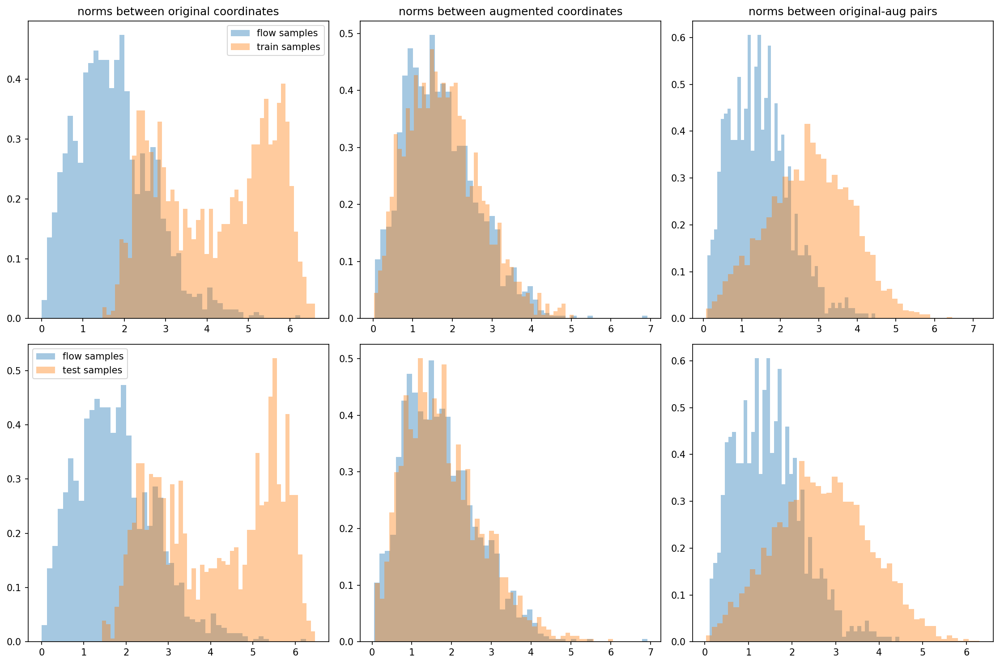

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


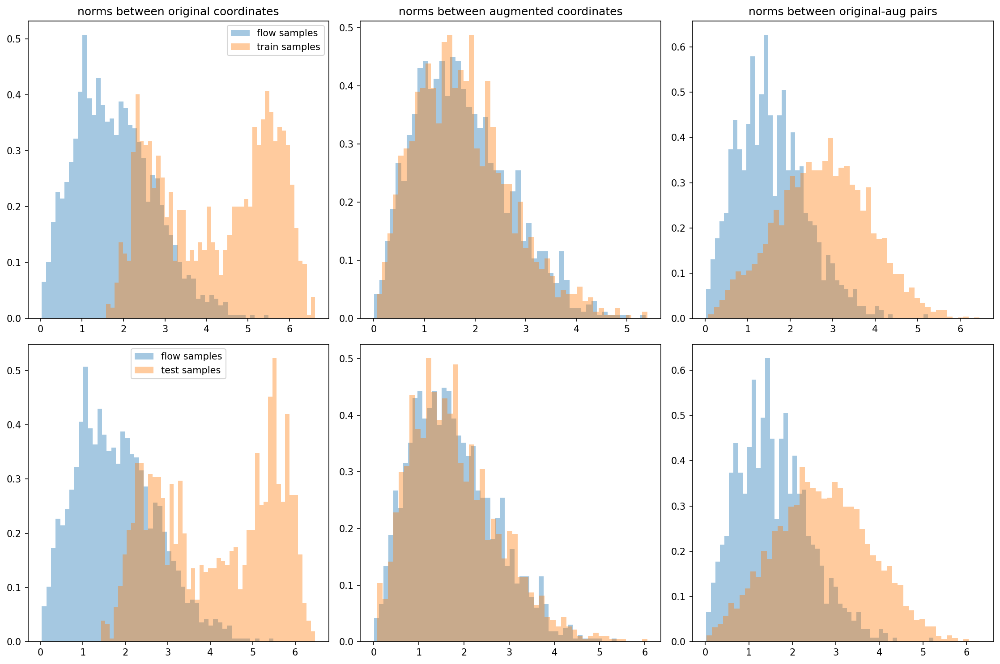

  1%|▍                                          | 2/200 [00:18<24:36,  7.46s/it]

{'eval_log_lik': Array(-27.734537, dtype=float32), 'eval_marginal_log_lik': Array(-17.40238, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.771088e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.2495041e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|█████                                     | 24/200 [00:20<00:22,  7.97it/s]

{'eval_log_lik': Array(-21.478863, dtype=float32), 'eval_marginal_log_lik': Array(-11.182897, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.449554e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4614105e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:22<00:18,  8.70it/s]

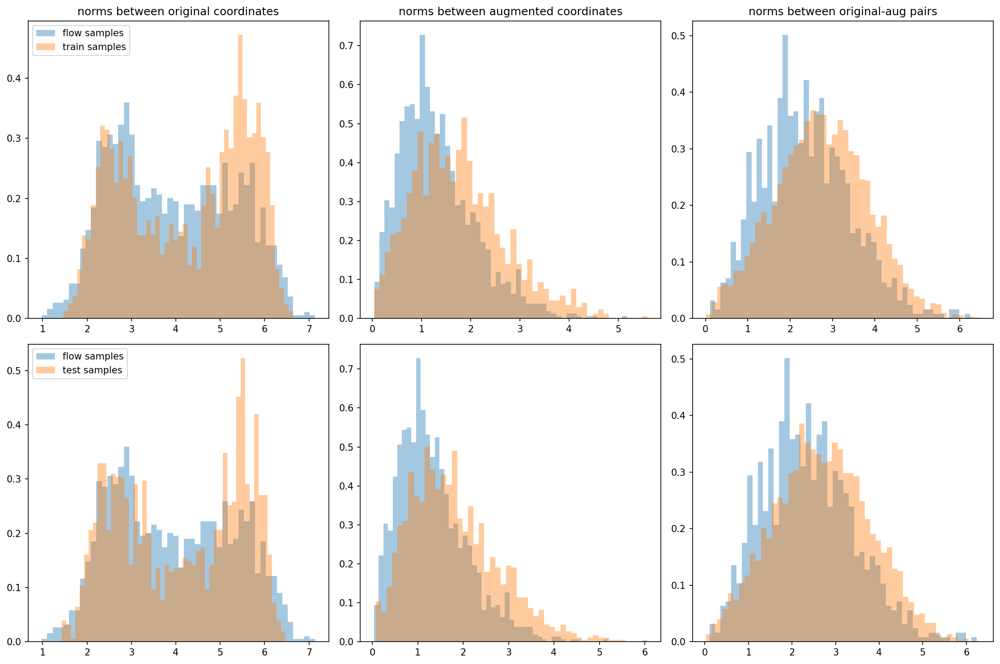

 23%|█████████▋                                | 46/200 [00:26<00:38,  3.99it/s]

{'eval_log_lik': Array(-21.177011, dtype=float32), 'eval_marginal_log_lik': Array(-10.931916, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.580353e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.3878823e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████▎                           | 68/200 [00:29<00:16,  7.77it/s]

{'eval_log_lik': Array(-21.045603, dtype=float32), 'eval_marginal_log_lik': Array(-10.7358465, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.572174e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5307425e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:30<00:14,  8.57it/s]

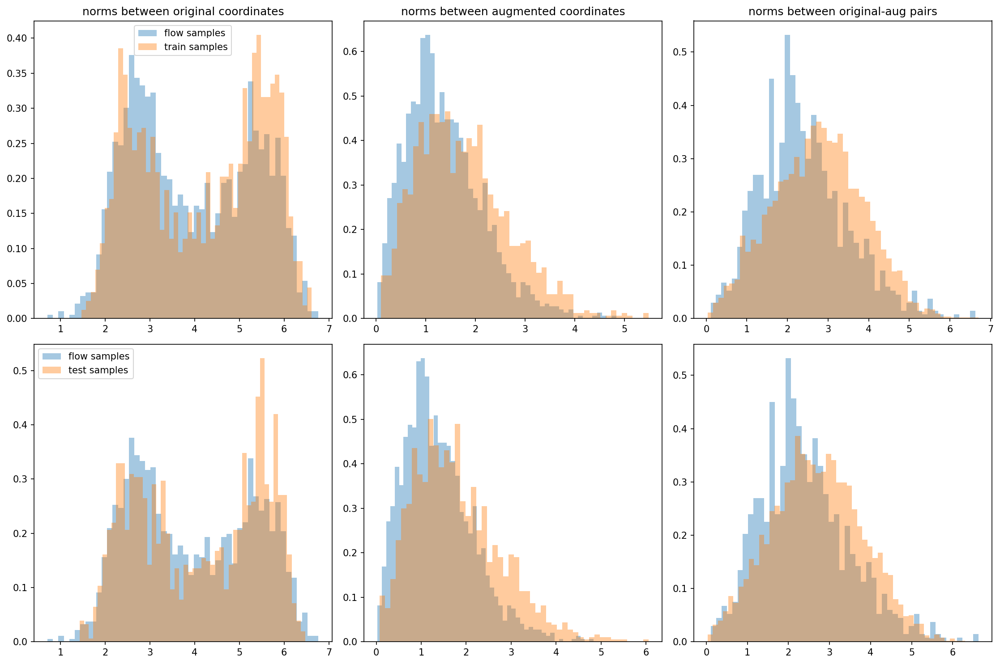

 45%|██████████████████▉                       | 90/200 [00:35<00:16,  6.55it/s]

{'eval_log_lik': Array(-21.070698, dtype=float32), 'eval_marginal_log_lik': Array(-10.839381, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.115768e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4931679e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▉                  | 112/200 [00:37<00:10,  8.16it/s]

{'eval_log_lik': Array(-21.056767, dtype=float32), 'eval_marginal_log_lik': Array(-10.773126, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.7165834e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5267373e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [00:38<00:09,  8.63it/s]

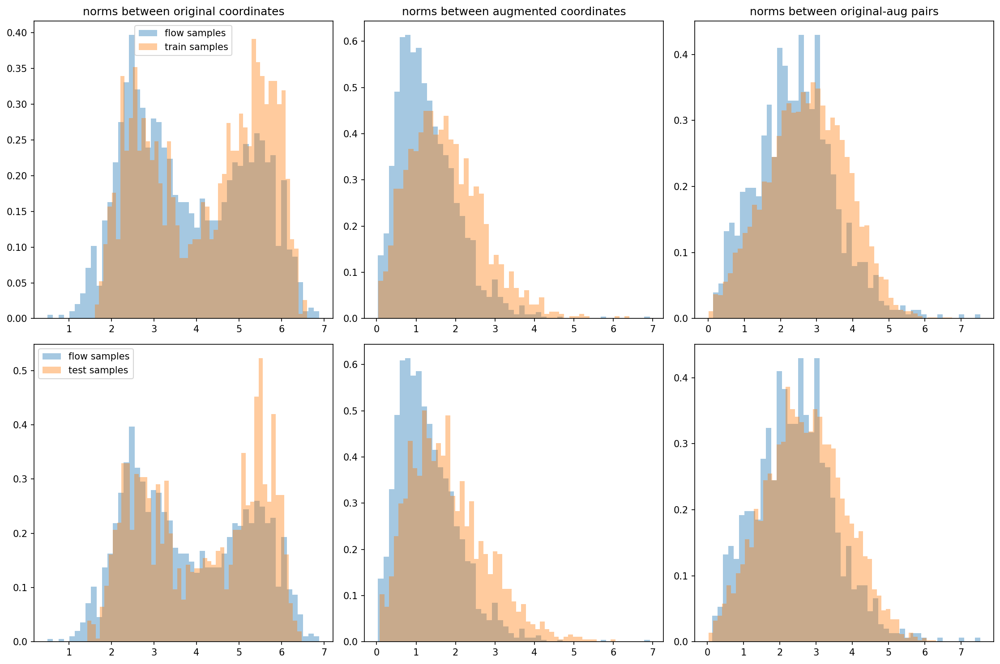

 67%|███████████████████████████▍             | 134/200 [00:43<00:08,  7.73it/s]

{'eval_log_lik': Array(-20.986467, dtype=float32), 'eval_marginal_log_lik': Array(-10.719471, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.269715e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5826225e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▉         | 156/200 [00:46<00:05,  8.15it/s]

{'eval_log_lik': Array(-21.013643, dtype=float32), 'eval_marginal_log_lik': Array(-10.642955, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.441376e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5686035e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [00:46<00:04,  8.32it/s]

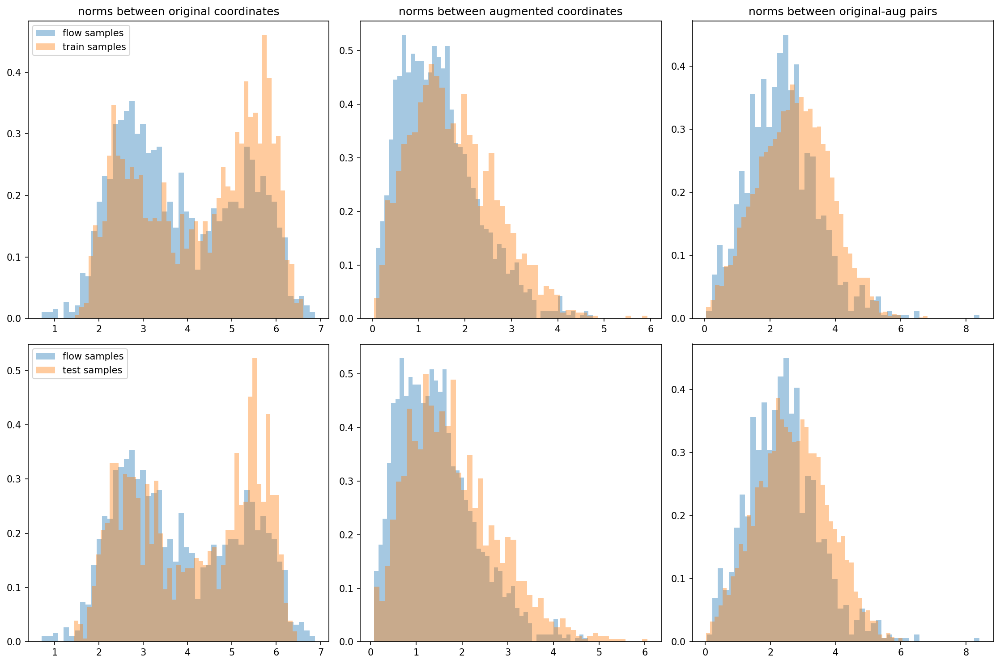

 89%|████████████████████████████████████▍    | 178/200 [00:52<00:02,  7.69it/s]

{'eval_log_lik': Array(-21.007555, dtype=float32), 'eval_marginal_log_lik': Array(-10.695473, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.133484e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5018464e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [00:54<00:00,  8.71it/s]

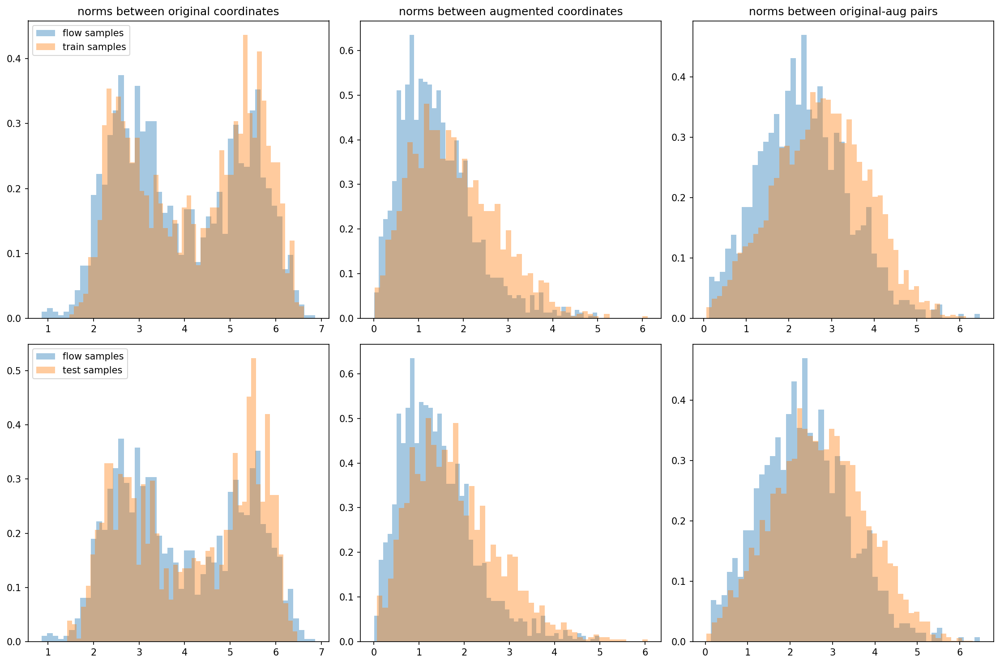

100%|█████████████████████████████████████████| 200/200 [00:58<00:00,  3.43it/s]


{'eval_log_lik': Array(-21.014975, dtype=float32), 'eval_marginal_log_lik': Array(-10.620141, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.678436e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5406607e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


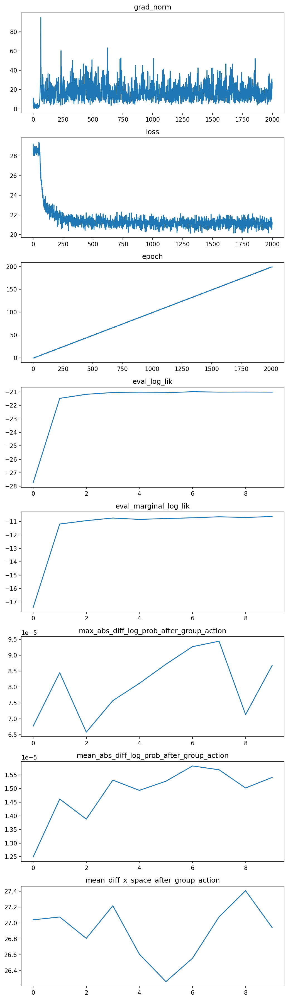

In [8]:
experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)

logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

In [9]:
train_data, test_data = load_dataset(batch_size=cfg.training.batch_size, train_set_size=1000, test_set_size=1000)

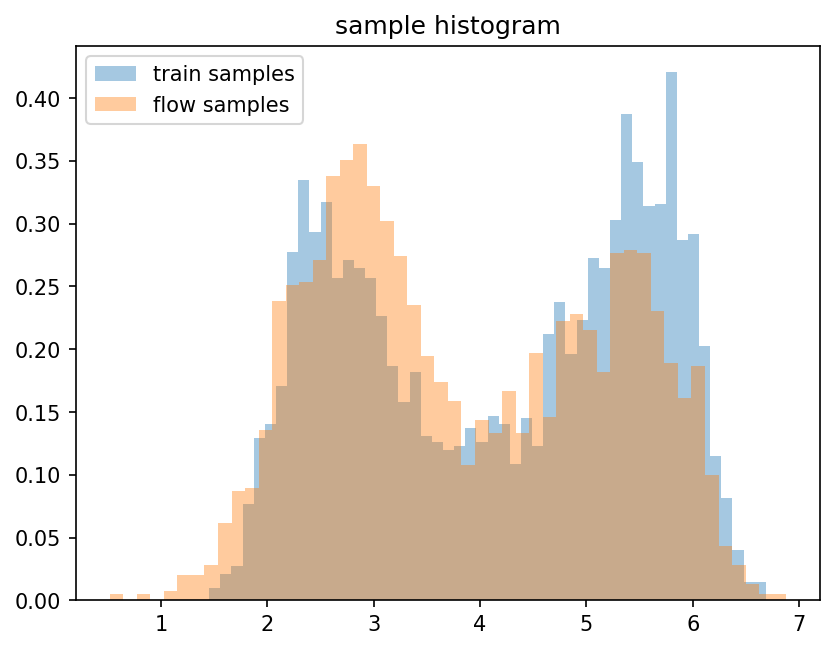

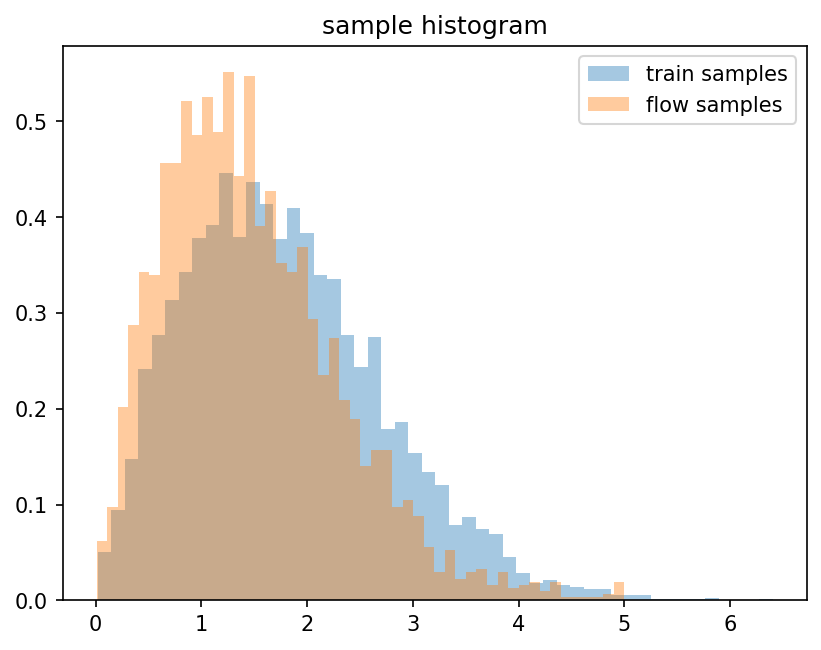

In [10]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

In [11]:
eval_fn(params=params, x=test_data, flow_log_prob_fn=log_prob_fn,
                                flow_sample_and_log_prob_fn=sample_and_log_prob_fn,
                                target_log_prob=dw4.log_prob_fn,
                                key=jax.random.PRNGKey(1), batch_size=cfg.training.batch_size,
                                K=50)

{'ess': Array(0.06309083, dtype=float32),
 'eval_kl': Array(-307.2511, dtype=float32),
 'eval_log_lik': Array(-21.014975, dtype=float32),
 'eval_marginal_log_lik': Array(-10.298175, dtype=float32),
 'max_abs_diff_log_prob_after_group_action': Array(8.106232e-05, dtype=float32),
 'mean_abs_diff_log_prob_after_group_action': Array(1.4714241e-05, dtype=float32),
 'mean_diff_x_space_after_group_action': Array(26.565018, dtype=float32)}

# More expresive flow: add act norm
Doesn't seem to help

In [12]:
cfg.flow.type= "nice"
cfg.flow.act_norm = True

training data shape of (1000, 4, 4)


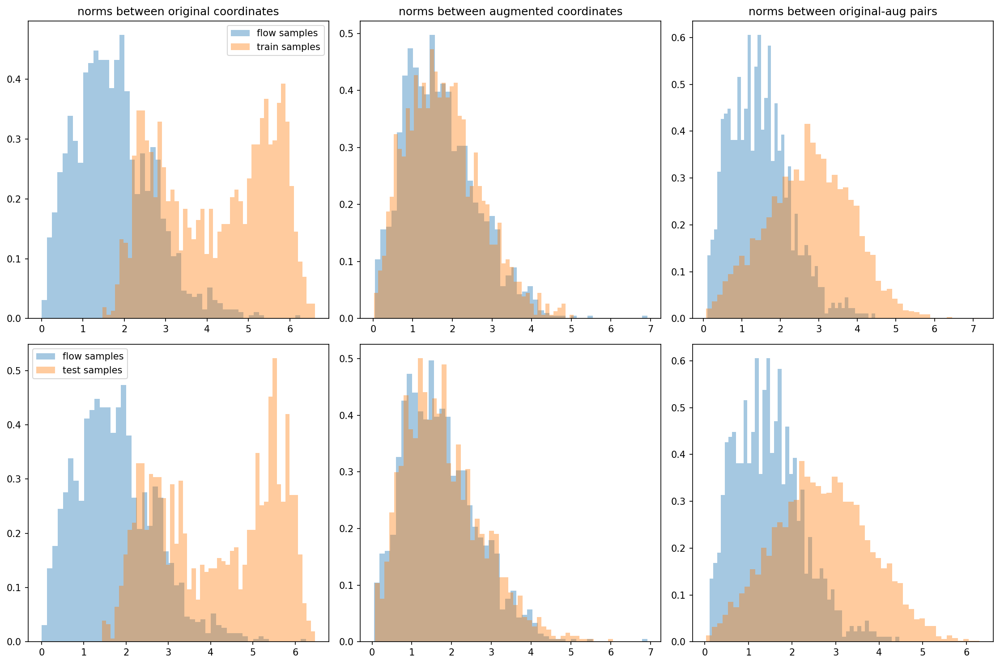

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


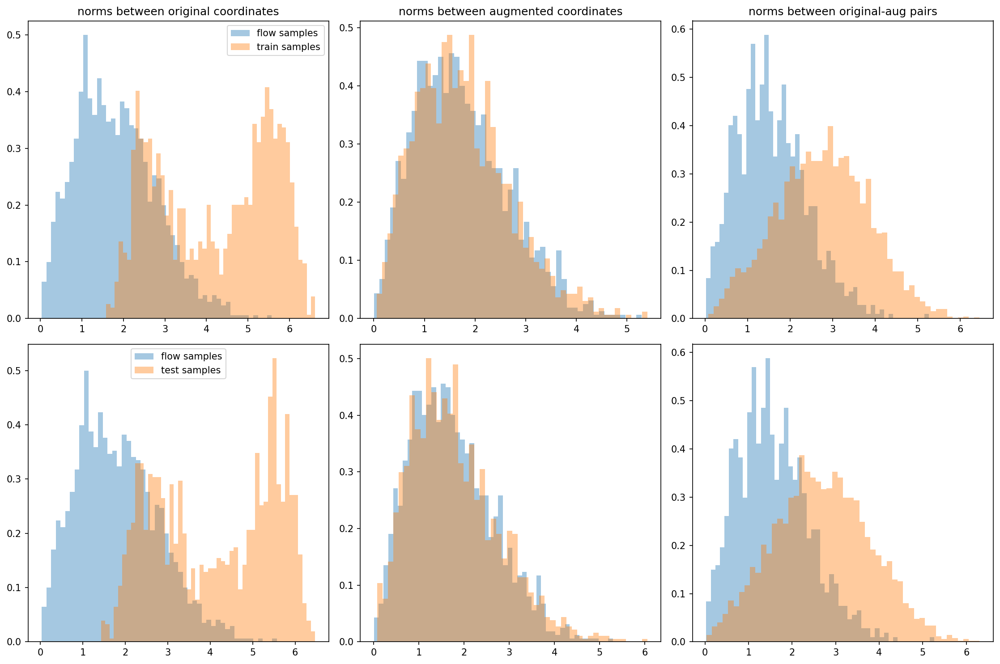

  1%|▍                                          | 2/200 [00:18<24:48,  7.52s/it]

{'eval_log_lik': Array(-27.41767, dtype=float32), 'eval_marginal_log_lik': Array(-17.085512, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.266999e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4755249e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|█████                                     | 24/200 [00:20<00:22,  7.93it/s]

{'eval_log_lik': Array(-21.116972, dtype=float32), 'eval_marginal_log_lik': Array(-10.821009, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.637573e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.3391495e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:22<00:18,  8.53it/s]

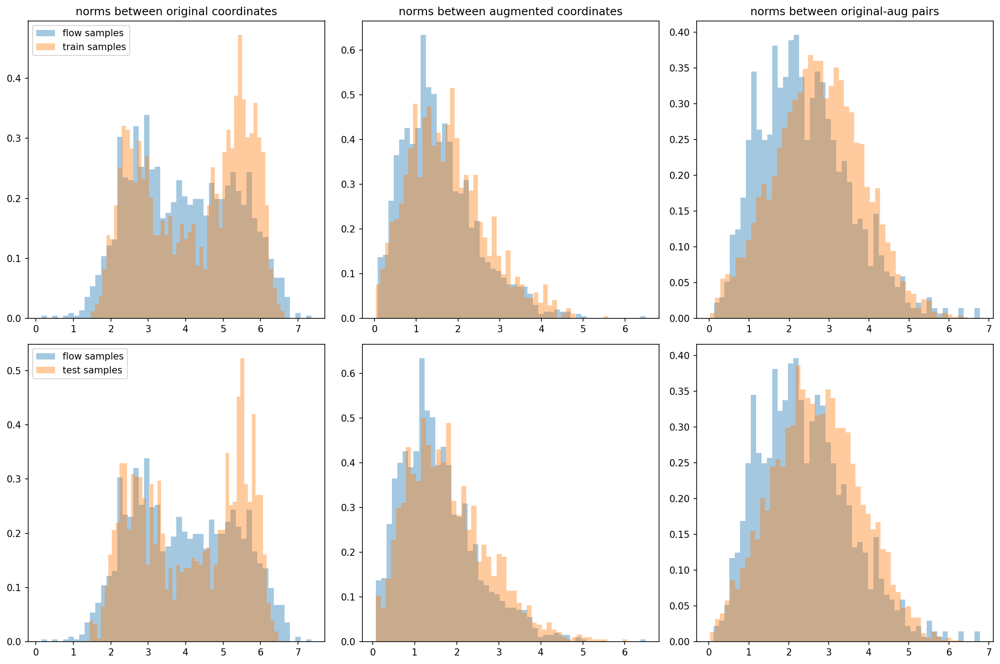

 23%|█████████▋                                | 46/200 [00:26<00:36,  4.16it/s]

{'eval_log_lik': Array(-20.89598, dtype=float32), 'eval_marginal_log_lik': Array(-10.65089, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.828308e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.3394356e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████▎                           | 68/200 [00:29<00:16,  8.01it/s]

{'eval_log_lik': Array(-20.843454, dtype=float32), 'eval_marginal_log_lik': Array(-10.533697, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.9618225e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.3633728e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:30<00:14,  8.51it/s]

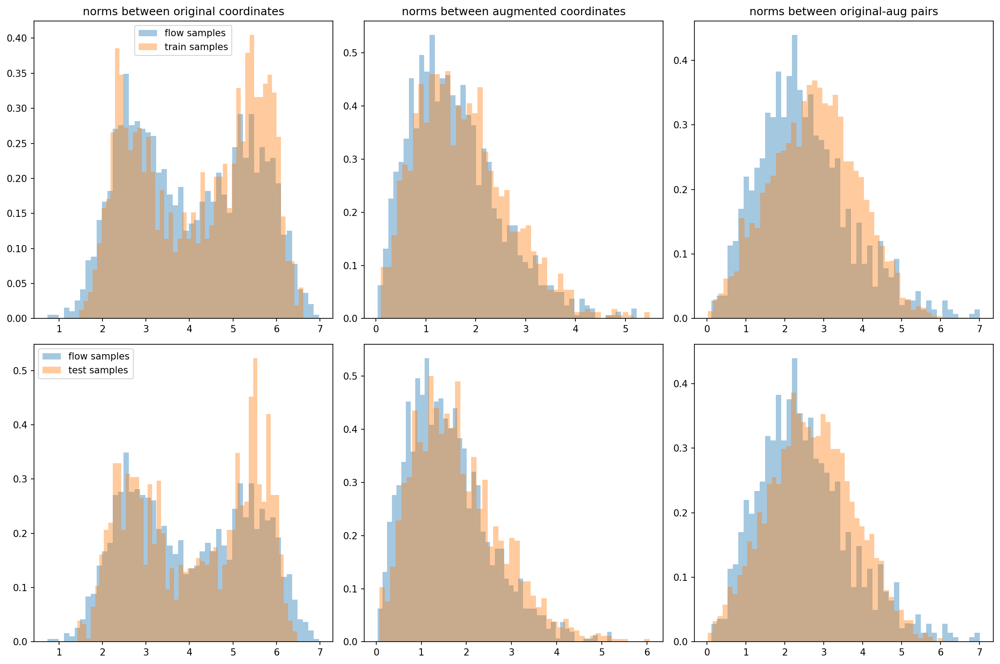

 45%|██████████████████▉                       | 90/200 [00:35<00:17,  6.44it/s]

{'eval_log_lik': Array(-20.846764, dtype=float32), 'eval_marginal_log_lik': Array(-10.615447, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.476807e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4004708e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▉                  | 112/200 [00:38<00:11,  7.99it/s]

{'eval_log_lik': Array(-20.837297, dtype=float32), 'eval_marginal_log_lik': Array(-10.5536585, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.678436e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4608383e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [00:38<00:09,  8.44it/s]

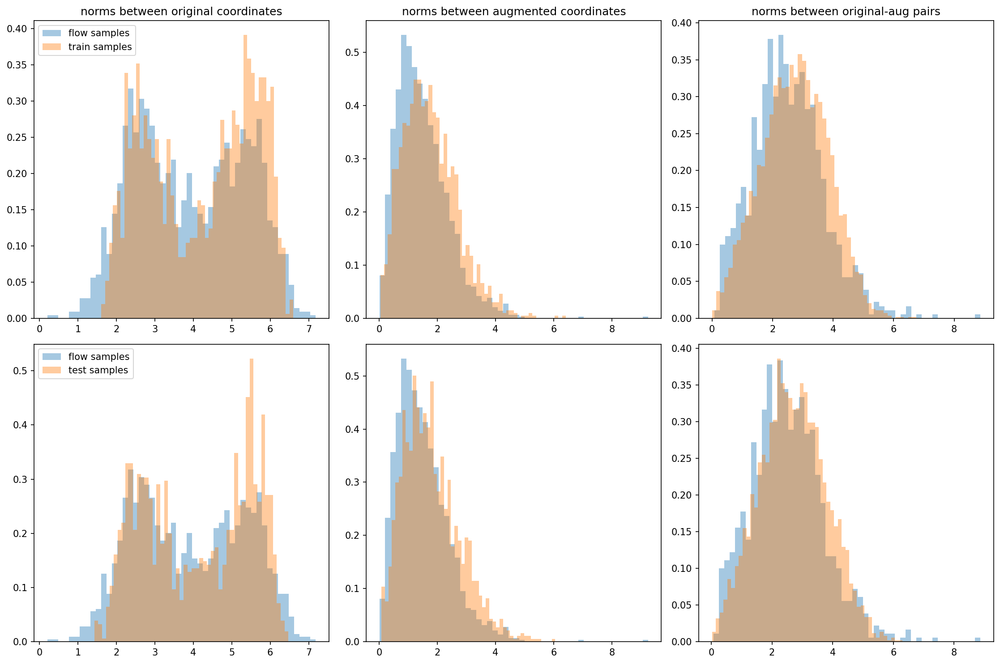

 67%|███████████████████████████▍             | 134/200 [00:44<00:08,  7.58it/s]

{'eval_log_lik': Array(-20.798956, dtype=float32), 'eval_marginal_log_lik': Array(-10.531959, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.6293945e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4776228e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▉         | 156/200 [00:46<00:05,  7.99it/s]

{'eval_log_lik': Array(-20.809706, dtype=float32), 'eval_marginal_log_lik': Array(-10.439014, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.392334e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.460743e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [00:47<00:04,  8.21it/s]

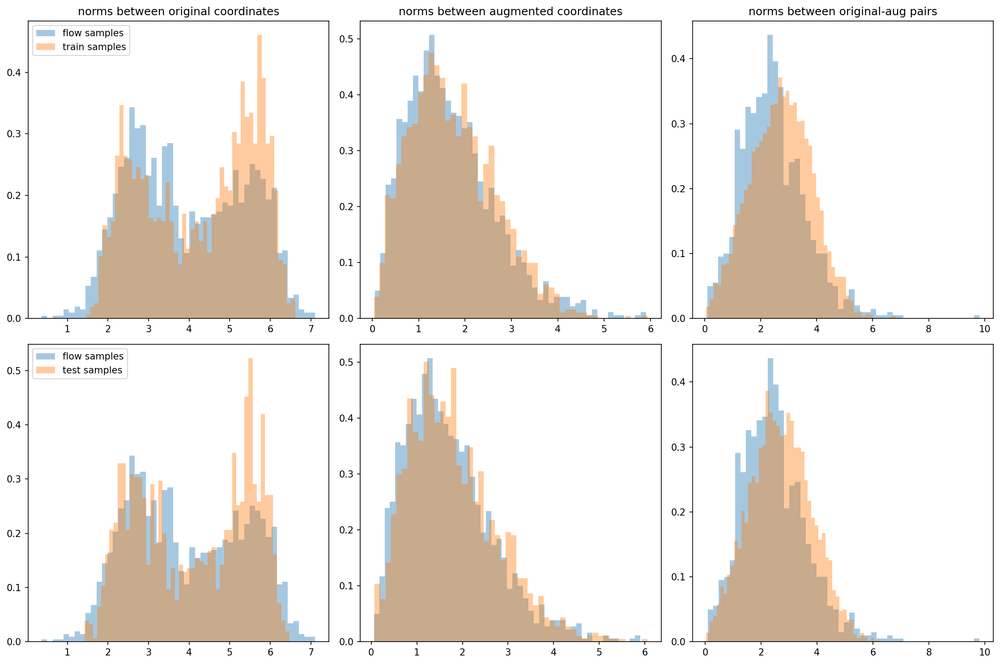

 89%|████████████████████████████████████▍    | 178/200 [00:52<00:02,  7.77it/s]

{'eval_log_lik': Array(-20.78229, dtype=float32), 'eval_marginal_log_lik': Array(-10.470208, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.065369e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4004707e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [00:55<00:00,  8.53it/s]

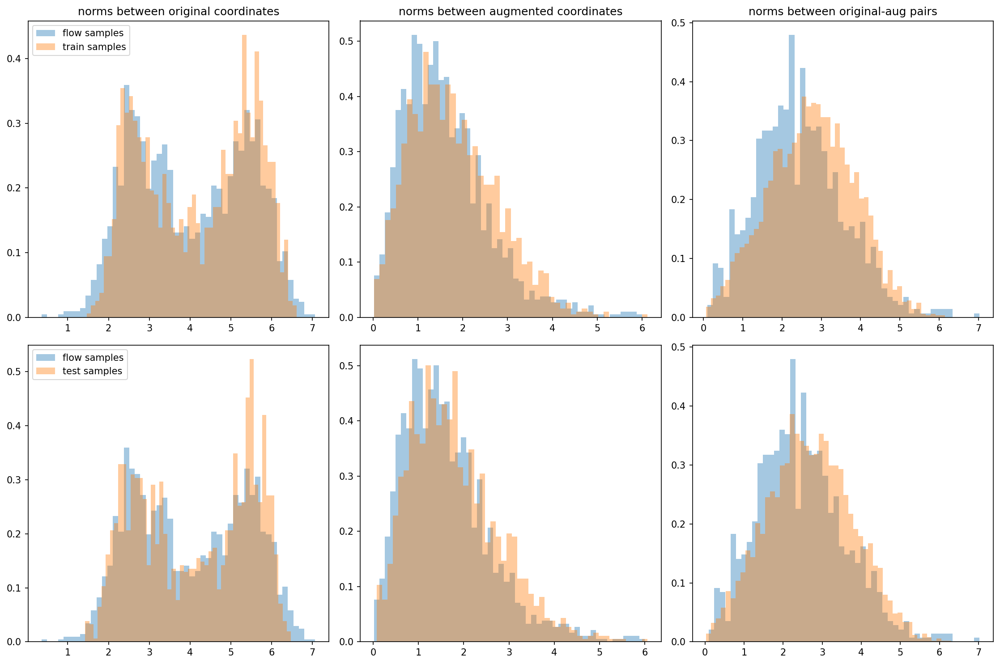

100%|█████████████████████████████████████████| 200/200 [00:58<00:00,  3.40it/s]


{'eval_log_lik': Array(-20.773909, dtype=float32), 'eval_marginal_log_lik': Array(-10.379076, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(6.580353e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.3599397e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


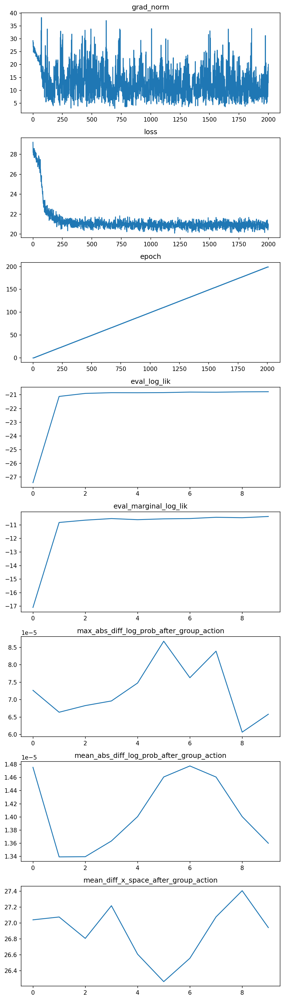

In [13]:
experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

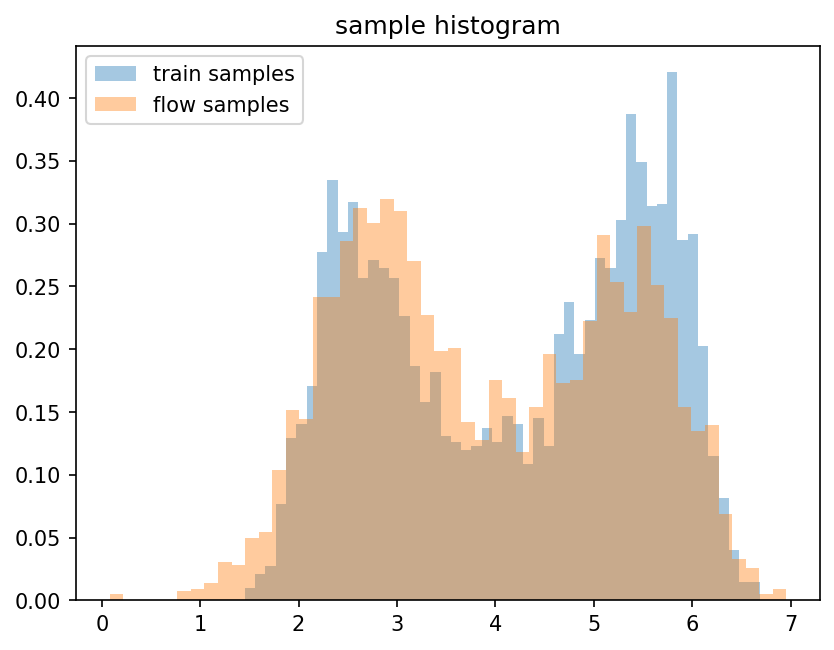

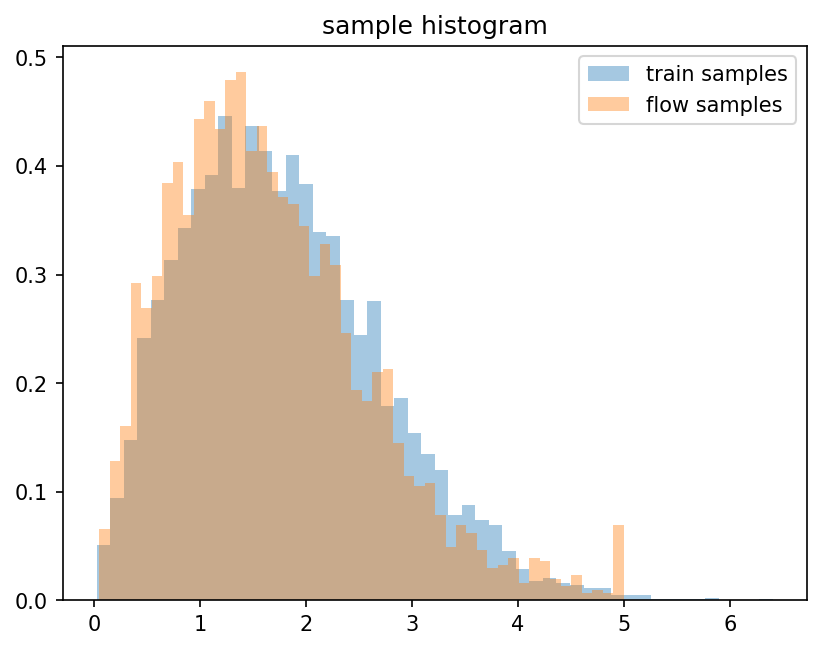

In [14]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# More expresive flow: add scale_along_vector
Doesn't seem to help

training data shape of (1000, 4, 4)


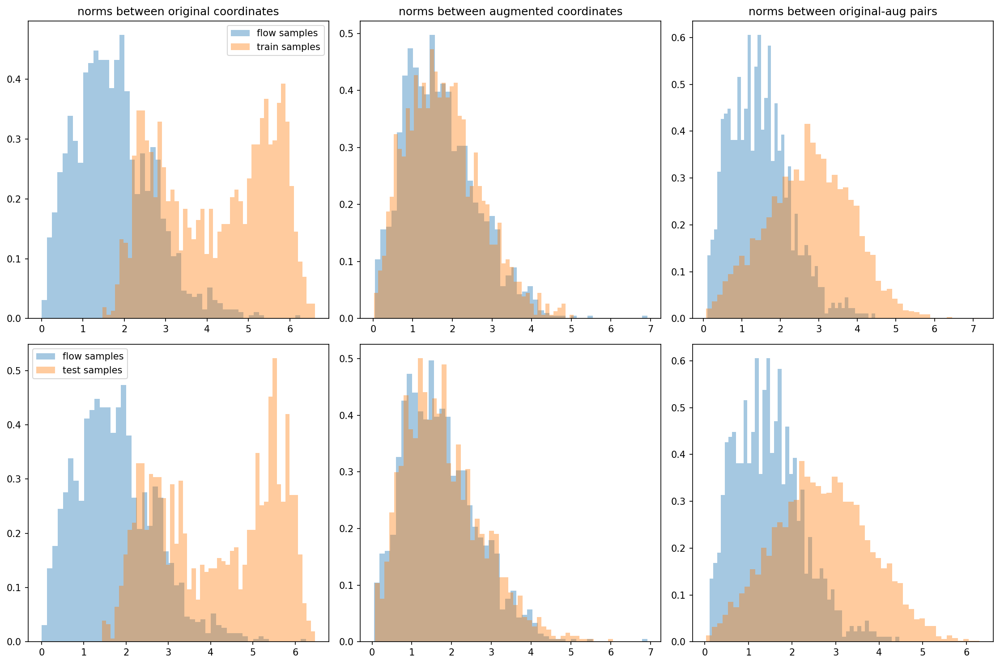

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


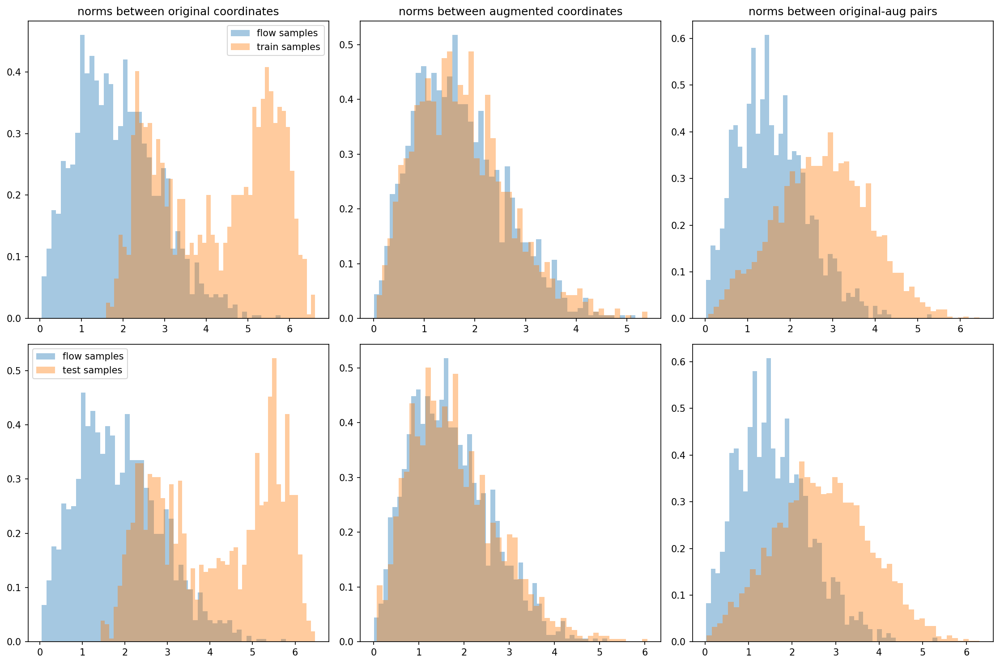

  0%|▏                                        | 1/200 [00:36<2:02:29, 36.93s/it]

{'eval_log_lik': Array(-26.950521, dtype=float32), 'eval_marginal_log_lik': Array(-16.618368, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.7165834e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.6477587e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|████▊                                     | 23/200 [00:42<00:47,  3.76it/s]

{'eval_log_lik': Array(-21.283947, dtype=float32), 'eval_marginal_log_lik': Array(-10.987983, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.1907045e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.4292716e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:46<00:38,  4.14it/s]

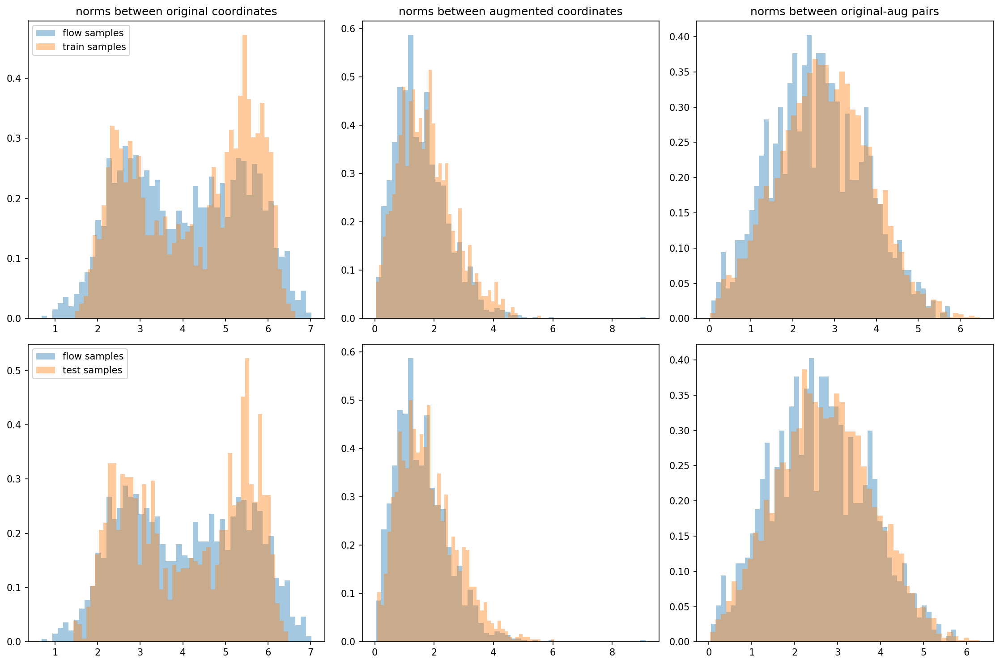

 22%|█████████▍                                | 45/200 [00:51<01:09,  2.22it/s]

{'eval_log_lik': Array(-21.004333, dtype=float32), 'eval_marginal_log_lik': Array(-10.759241, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(7.343292e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.5903472e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [00:56<00:35,  3.74it/s]

{'eval_log_lik': Array(-20.993736, dtype=float32), 'eval_marginal_log_lik': Array(-10.683979, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.3160405e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.6976357e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:59<00:29,  4.10it/s]

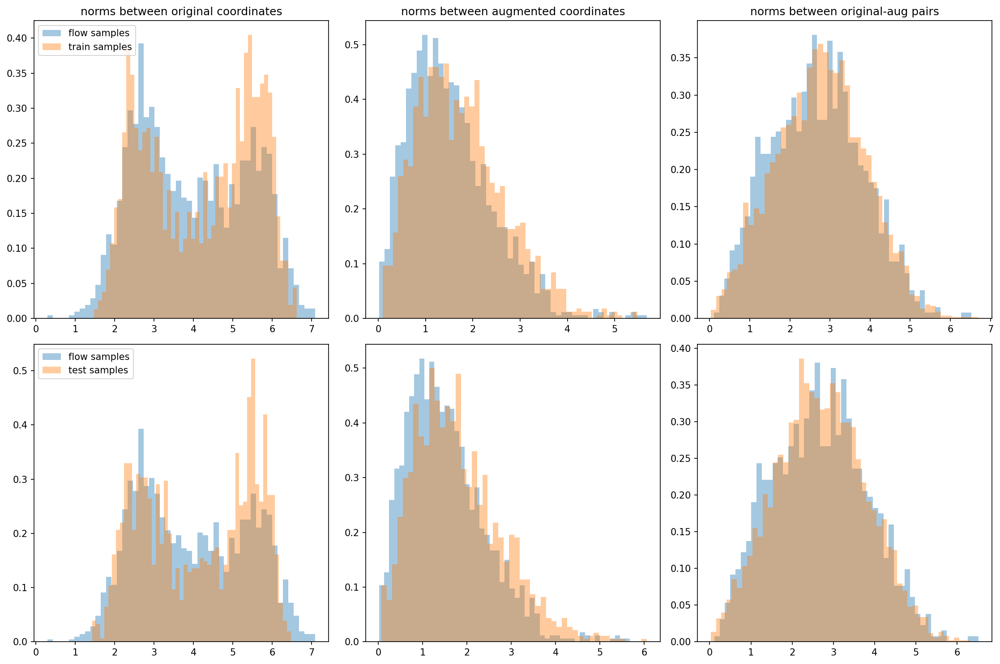

 44%|██████████████████▋                       | 89/200 [01:05<00:33,  3.29it/s]

{'eval_log_lik': Array(-20.919846, dtype=float32), 'eval_marginal_log_lik': Array(-10.688529, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(8.773804e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.678276e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▊                  | 111/200 [01:11<00:23,  3.74it/s]

{'eval_log_lik': Array(-20.931643, dtype=float32), 'eval_marginal_log_lik': Array(-10.648002, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00010109, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.7902375e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [01:13<00:19,  4.11it/s]

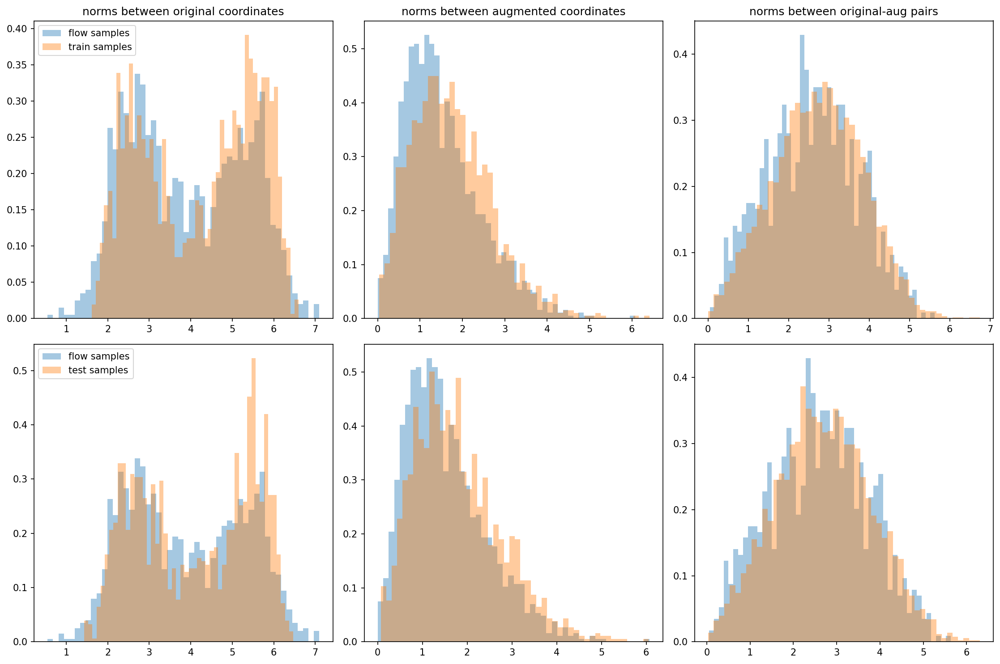

 66%|███████████████████████████▎             | 133/200 [01:19<00:18,  3.66it/s]

{'eval_log_lik': Array(-20.86686, dtype=float32), 'eval_marginal_log_lik': Array(-10.599864, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.326935e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.7828941e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▊         | 155/200 [01:25<00:12,  3.64it/s]

{'eval_log_lik': Array(-20.866257, dtype=float32), 'eval_marginal_log_lik': Array(-10.495567, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.000103, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.8969535e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [01:26<00:10,  4.00it/s]

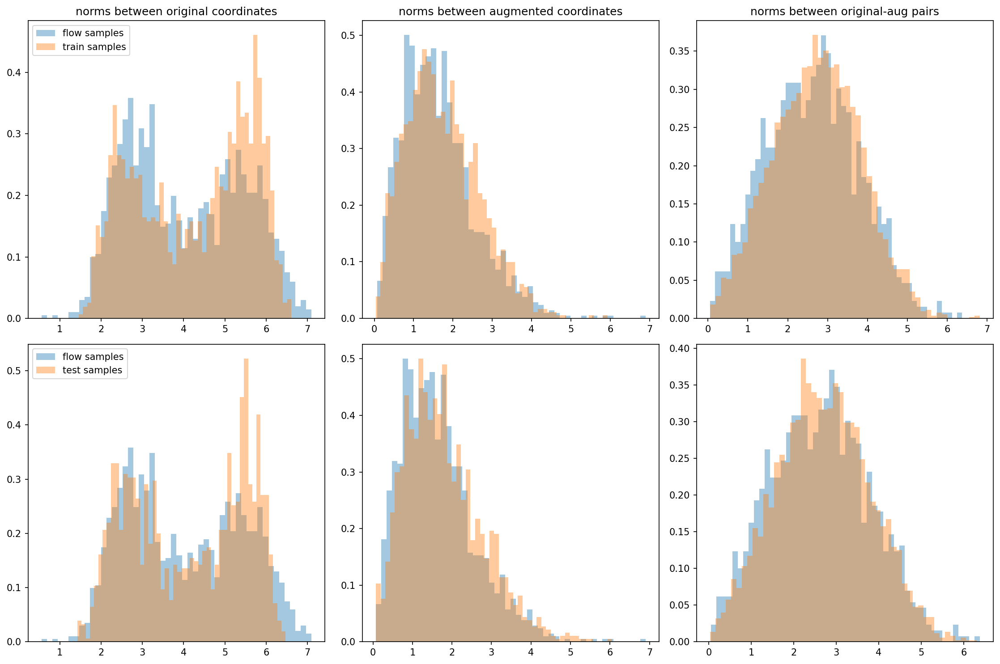

 88%|████████████████████████████████████▎    | 177/200 [01:34<00:06,  3.76it/s]

{'eval_log_lik': Array(-20.865046, dtype=float32), 'eval_marginal_log_lik': Array(-10.552963, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.3841554e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.8414497e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [01:39<00:00,  4.14it/s]

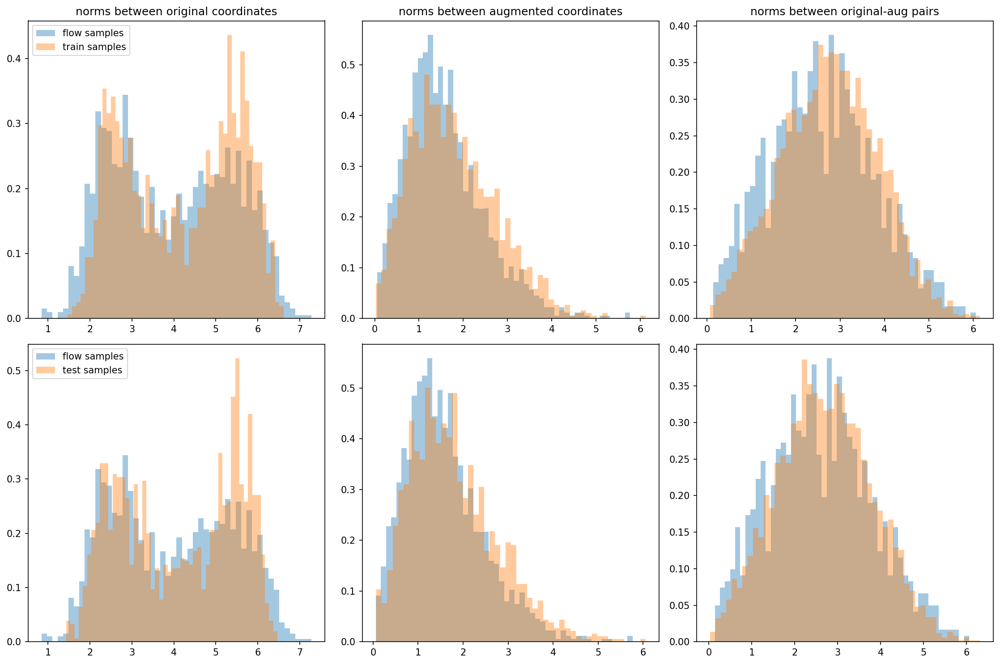

100%|█████████████████████████████████████████| 200/200 [01:43<00:00,  1.93it/s]


{'eval_log_lik': Array(-20.801077, dtype=float32), 'eval_marginal_log_lik': Array(-10.406245, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.57489e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.7844199e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


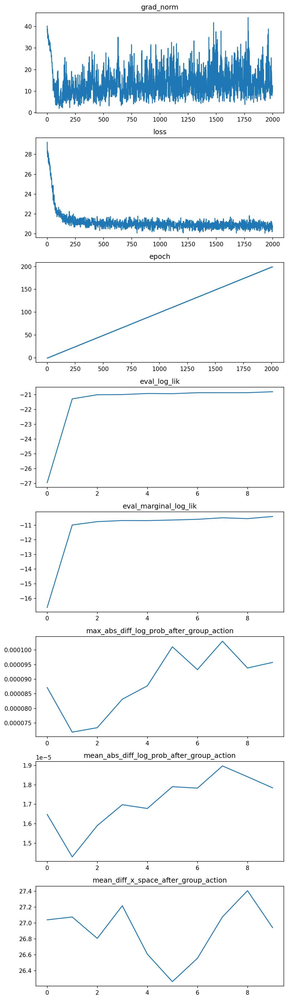

In [15]:
cfg.flow.type= "vector_scale_shift"
cfg.flow.act_norm = True

experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

# More expresive flow: proj flow
Doesn't seem to help

training data shape of (1000, 4, 4)


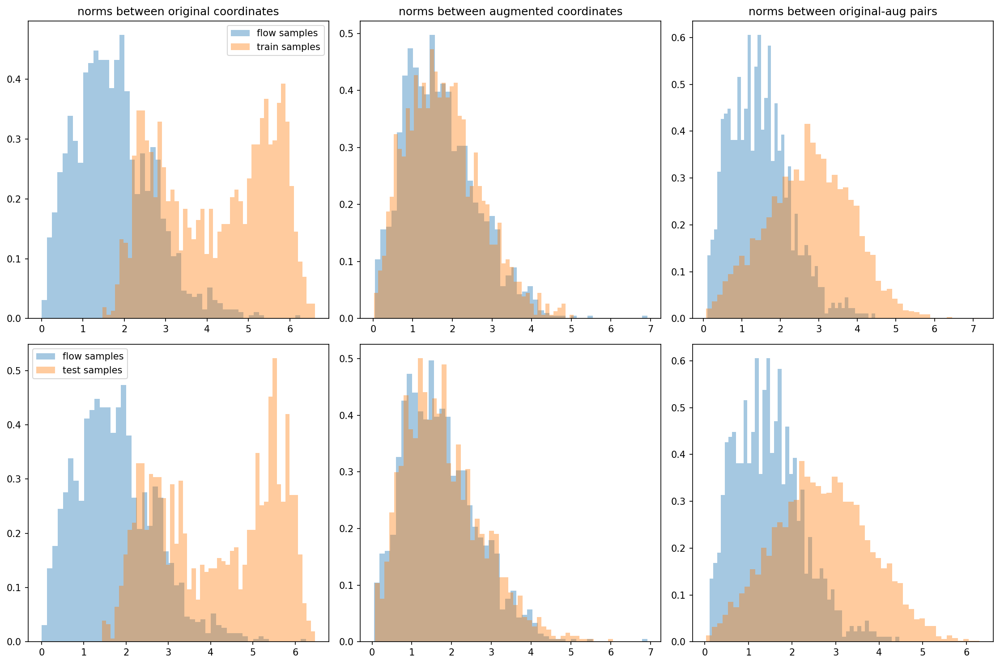

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


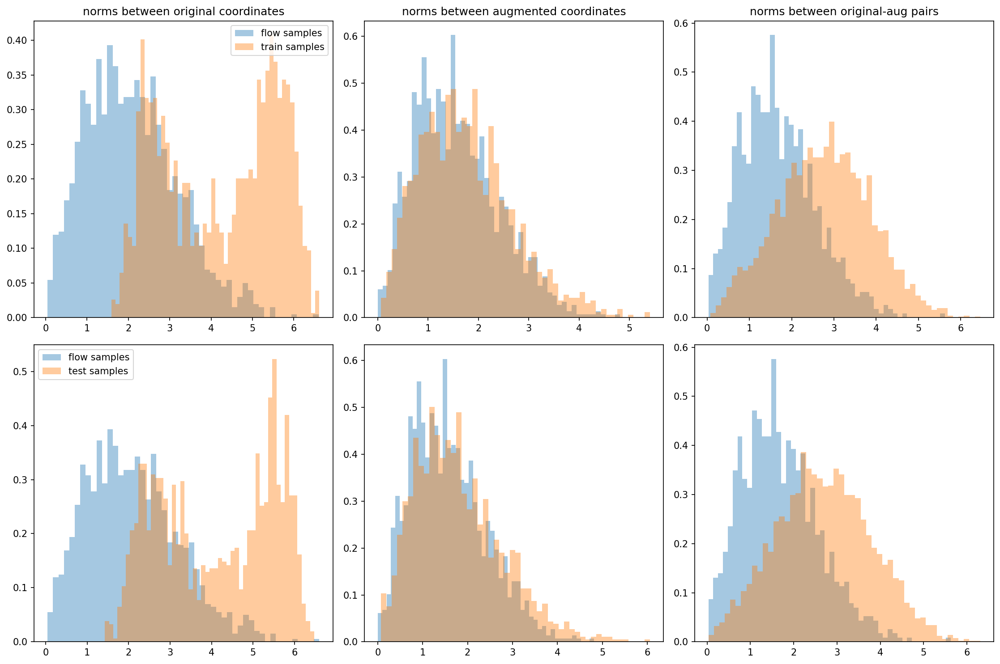

  0%|▏                                        | 1/200 [00:33<1:50:12, 33.23s/it]

{'eval_log_lik': Array(-25.34154, dtype=float32), 'eval_marginal_log_lik': Array(-15.009384, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00028343, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.3889543e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|█████                                     | 24/200 [00:37<00:33,  5.24it/s]

{'eval_log_lik': Array(-21.06156, dtype=float32), 'eval_marginal_log_lik': Array(-10.765597, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00300102, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00019634, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:40<00:28,  5.74it/s]

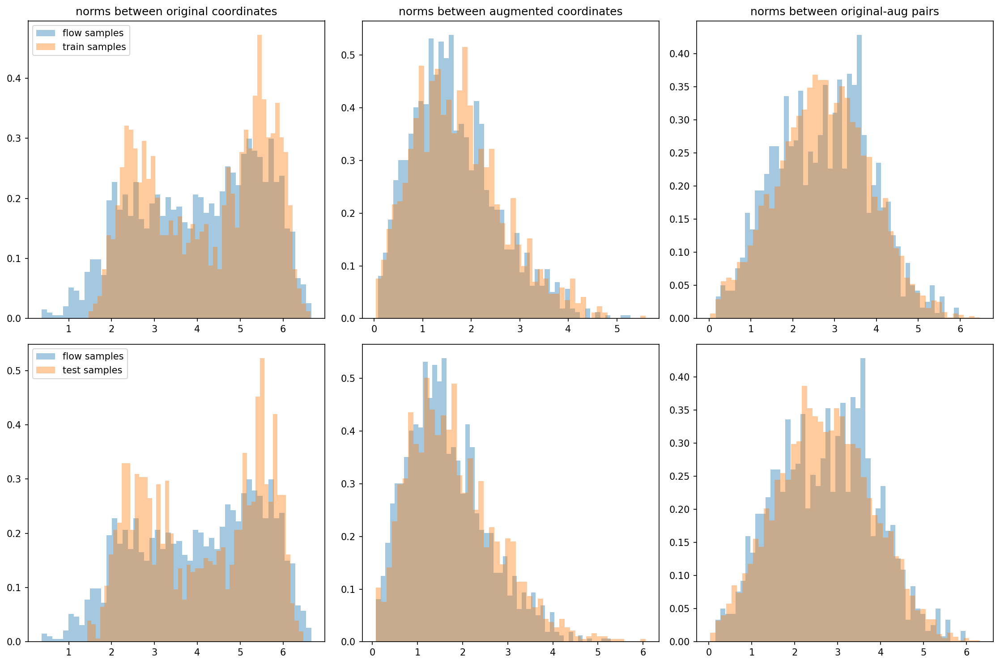

 23%|█████████▋                                | 46/200 [00:44<00:48,  3.16it/s]

{'eval_log_lik': Array(-20.291922, dtype=float32), 'eval_marginal_log_lik': Array(-10.046829, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00099831, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00013018, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [00:48<00:25,  5.24it/s]

{'eval_log_lik': Array(-19.220573, dtype=float32), 'eval_marginal_log_lik': Array(-8.910817, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00308952, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.0002479, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:50<00:21,  5.76it/s]

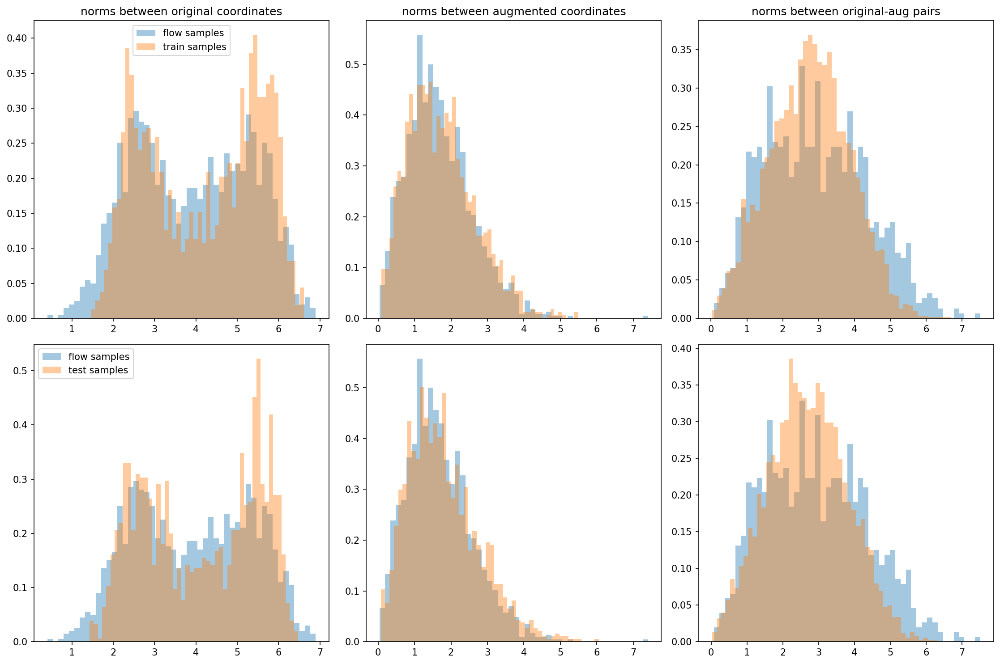

 45%|██████████████████▉                       | 90/200 [00:56<00:24,  4.46it/s]

{'eval_log_lik': Array(-18.506655, dtype=float32), 'eval_marginal_log_lik': Array(-8.275336, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00263805, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00025645, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▉                  | 112/200 [01:00<00:16,  5.30it/s]

{'eval_log_lik': Array(-18.315884, dtype=float32), 'eval_marginal_log_lik': Array(-8.032242, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00445576, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.0003296, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [01:01<00:14,  5.75it/s]

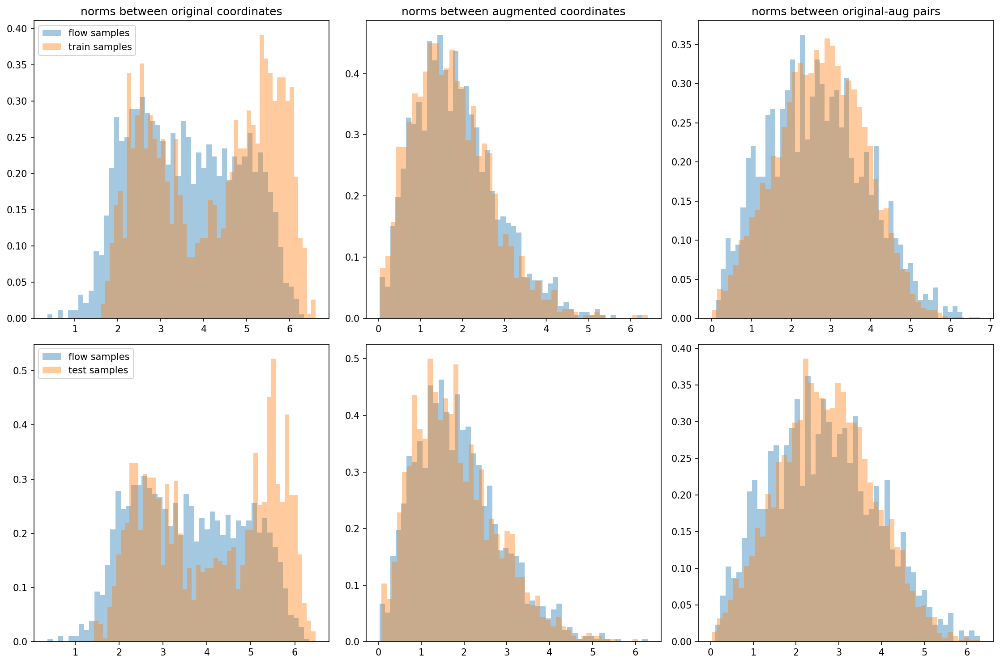

 67%|███████████████████████████▍             | 134/200 [01:07<00:12,  5.21it/s]

{'eval_log_lik': Array(-18.20548, dtype=float32), 'eval_marginal_log_lik': Array(-7.9384804, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00299587, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00034688, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▉         | 156/200 [01:11<00:08,  5.26it/s]

{'eval_log_lik': Array(-18.025522, dtype=float32), 'eval_marginal_log_lik': Array(-7.6548295, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00535612, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00033531, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [01:11<00:07,  5.56it/s]

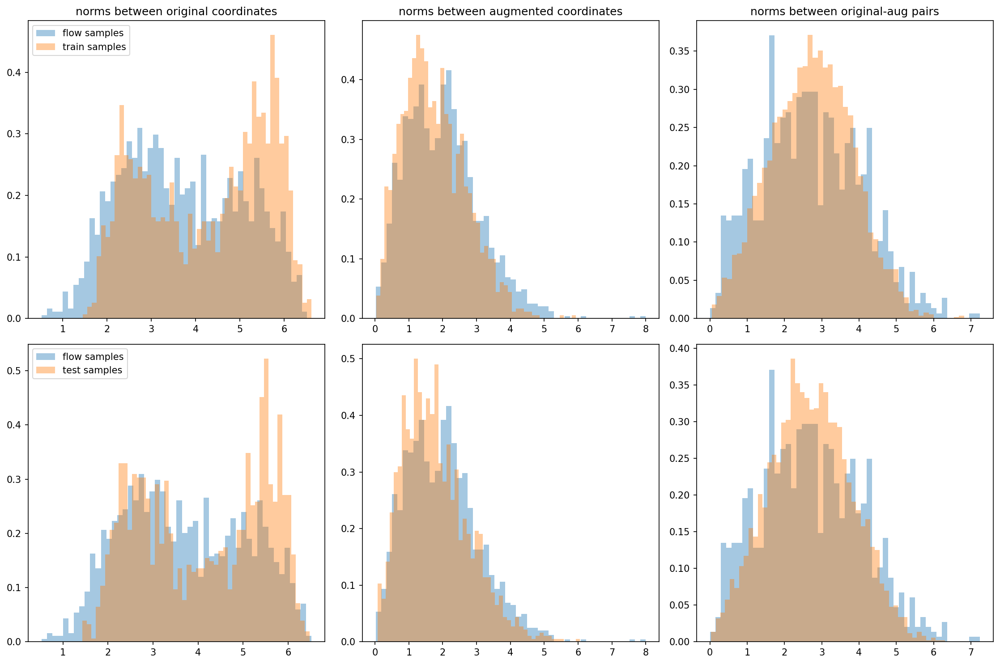

 89%|████████████████████████████████████▍    | 178/200 [01:18<00:04,  5.32it/s]

{'eval_log_lik': Array(-18.016226, dtype=float32), 'eval_marginal_log_lik': Array(-7.704145, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00336742, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00033277, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [01:22<00:00,  5.77it/s]

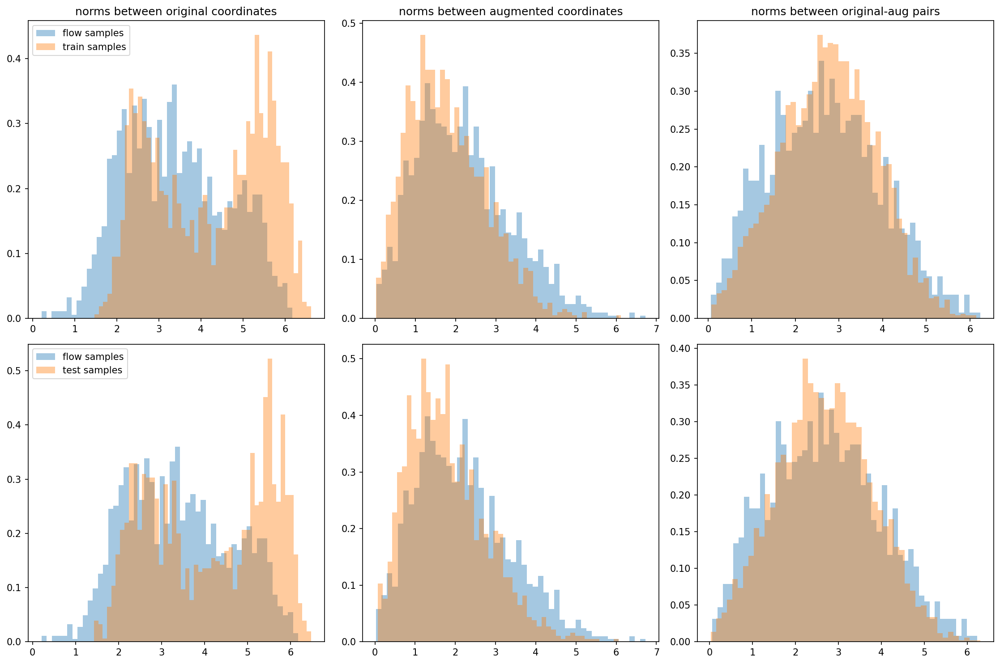

100%|█████████████████████████████████████████| 200/200 [01:26<00:00,  2.32it/s]


{'eval_log_lik': Array(-17.49909, dtype=float32), 'eval_marginal_log_lik': Array(-7.104255, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00417156, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00043032, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


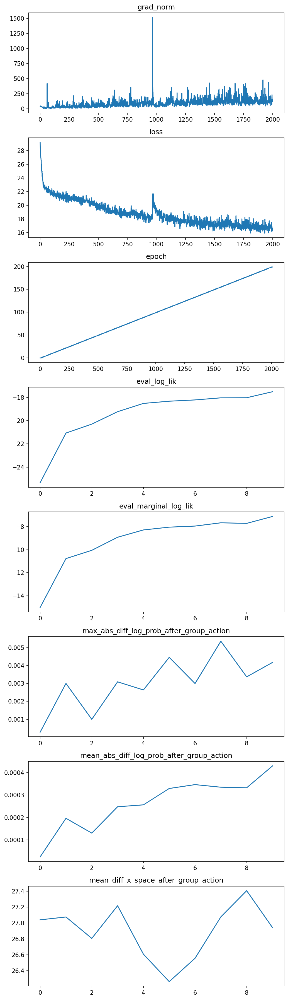

In [16]:
cfg.flow.type= "proj"
cfg.flow.act_norm = True
cfg.flow.kwargs.proj_v2.mlp_function_units = (32, 32)

experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

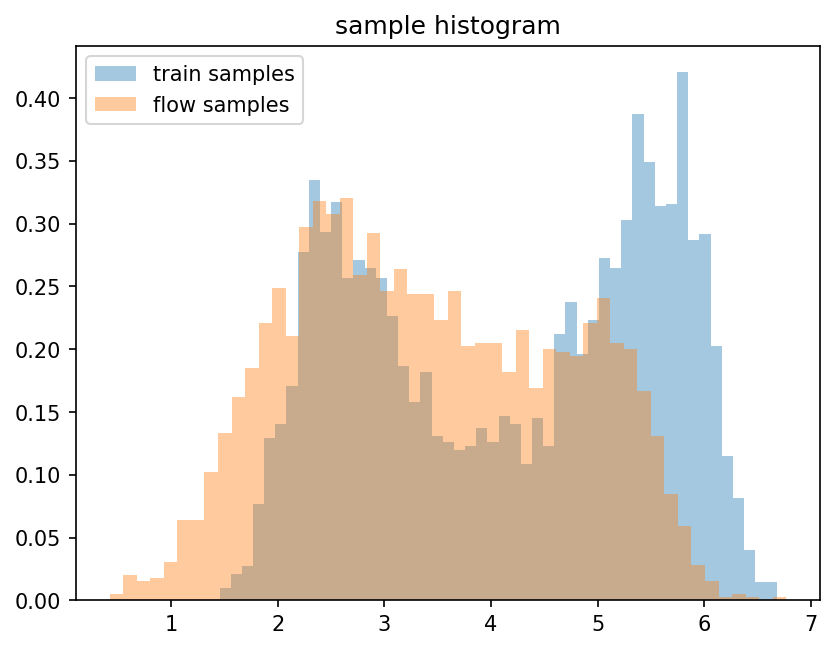

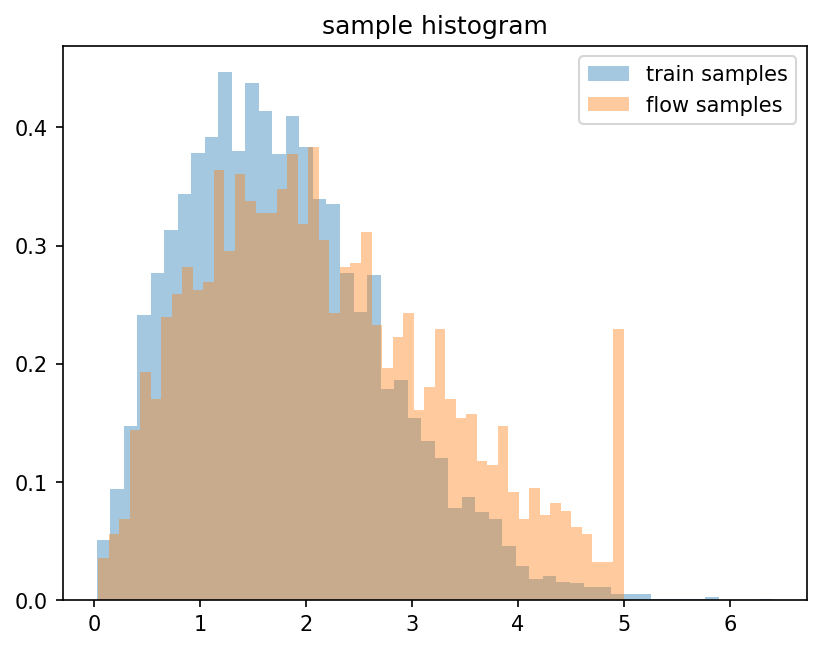

In [17]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# Alternative proj flow
- this is the VERY expensive flow.

training data shape of (1000, 4, 4)


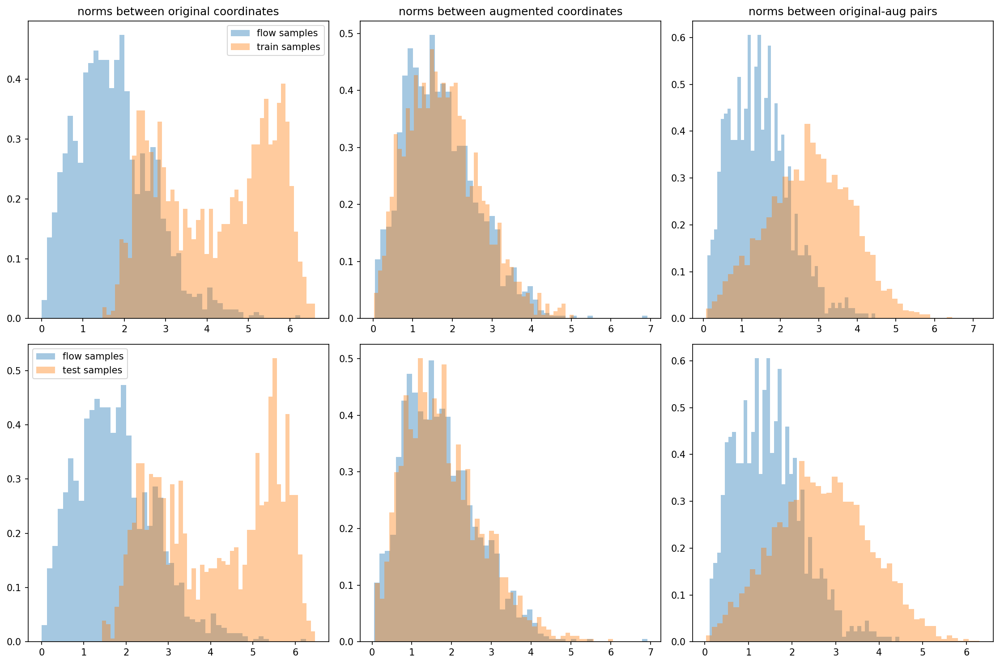

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


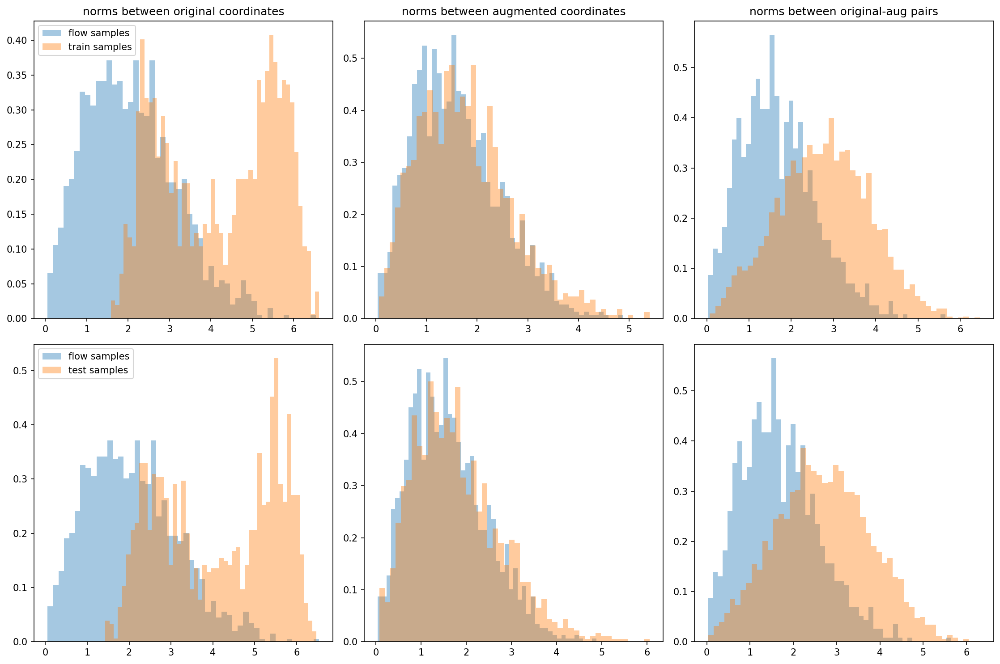

  0%|▏                                        | 1/200 [00:41<2:17:52, 41.57s/it]

{'eval_log_lik': Array(-25.464308, dtype=float32), 'eval_marginal_log_lik': Array(-15.1321535, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00022717, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.0656586e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|████▊                                     | 23/200 [00:48<00:56,  3.13it/s]

{'eval_log_lik': Array(-21.446386, dtype=float32), 'eval_marginal_log_lik': Array(-11.150423, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00189323, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00012615, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:52<00:46,  3.50it/s]

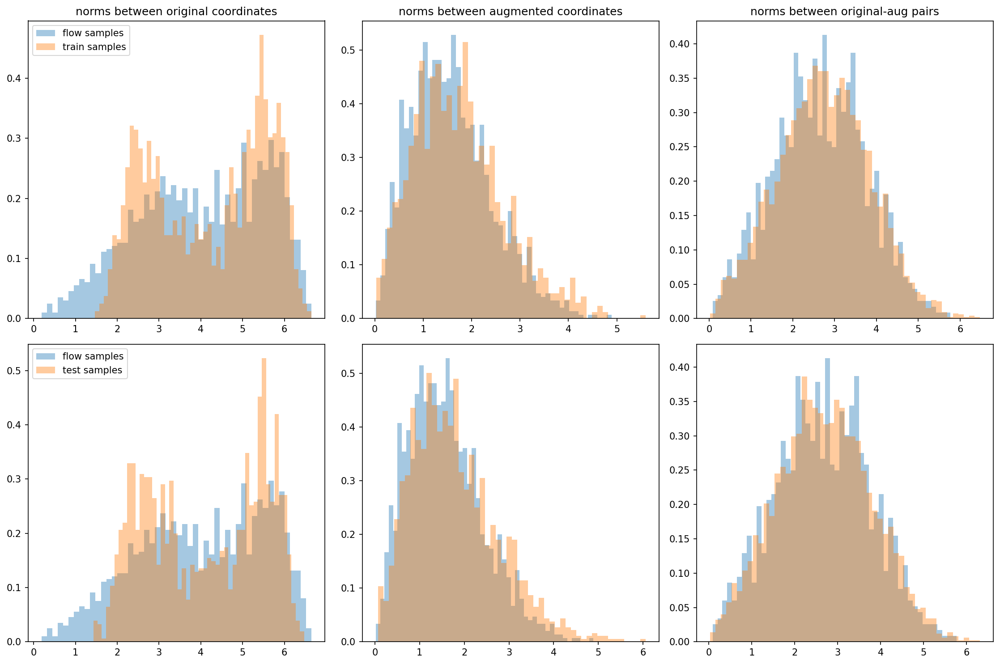

 22%|█████████▍                                | 45/200 [00:57<01:15,  2.06it/s]

{'eval_log_lik': Array(-21.109632, dtype=float32), 'eval_marginal_log_lik': Array(-10.864538, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00706882, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00017022, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [01:04<00:41,  3.20it/s]

{'eval_log_lik': Array(-20.294876, dtype=float32), 'eval_marginal_log_lik': Array(-9.98512, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00162792, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00013619, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [01:07<00:34,  3.48it/s]

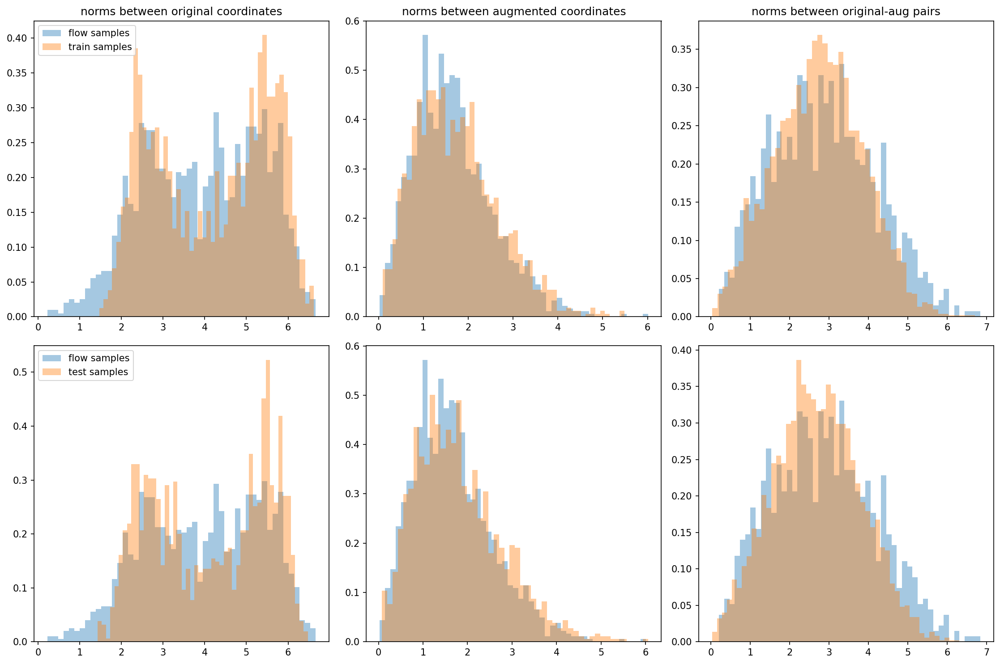

 44%|██████████████████▋                       | 89/200 [01:14<00:48,  2.27it/s]

{'eval_log_lik': Array(-19.473059, dtype=float32), 'eval_marginal_log_lik': Array(-9.241741, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00168438, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00013253, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▊                  | 111/200 [01:21<00:28,  3.13it/s]

{'eval_log_lik': Array(-19.049662, dtype=float32), 'eval_marginal_log_lik': Array(-8.766025, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00127678, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.0001336, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [01:23<00:23,  3.44it/s]

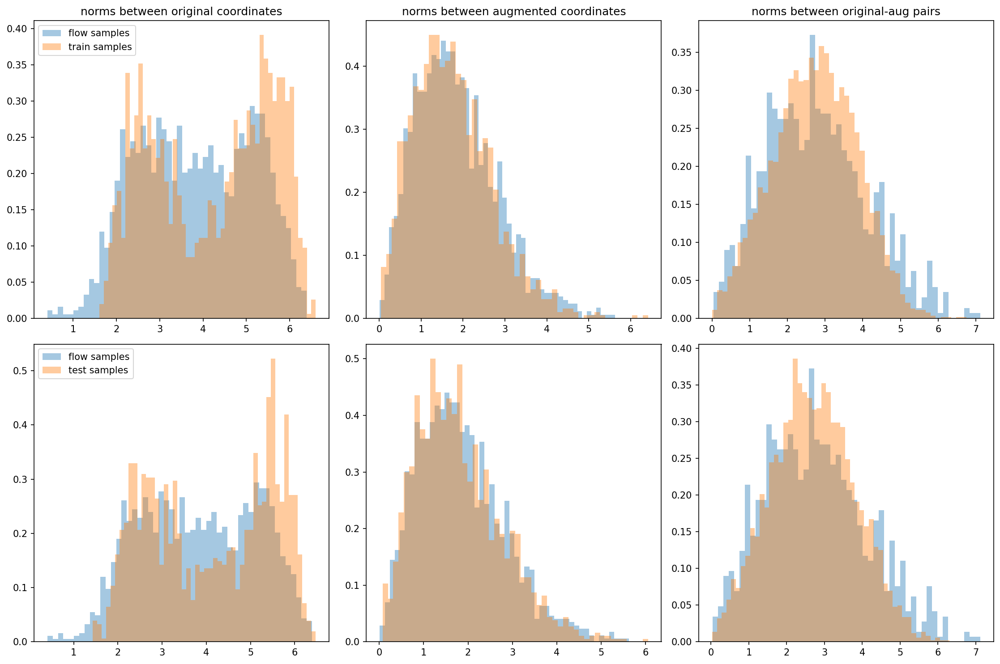

 66%|███████████████████████████▎             | 133/200 [01:31<00:21,  3.09it/s]

{'eval_log_lik': Array(-18.423914, dtype=float32), 'eval_marginal_log_lik': Array(-8.156918, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.0015625, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00017035, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▊         | 155/200 [01:37<00:14,  3.20it/s]

{'eval_log_lik': Array(-18.32945, dtype=float32), 'eval_marginal_log_lik': Array(-7.958759, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00167484, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00017071, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [01:38<00:12,  3.38it/s]

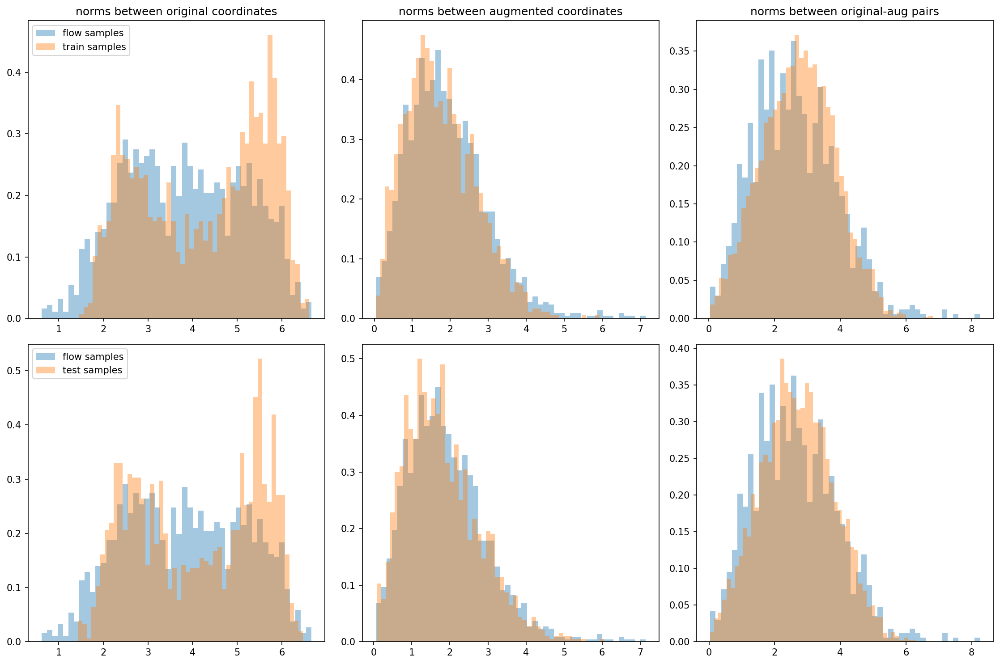

 88%|████████████████████████████████████▎    | 177/200 [01:47<00:07,  3.18it/s]

{'eval_log_lik': Array(-18.147186, dtype=float32), 'eval_marginal_log_lik': Array(-7.8351045, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00126553, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00014928, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [01:53<00:00,  3.47it/s]

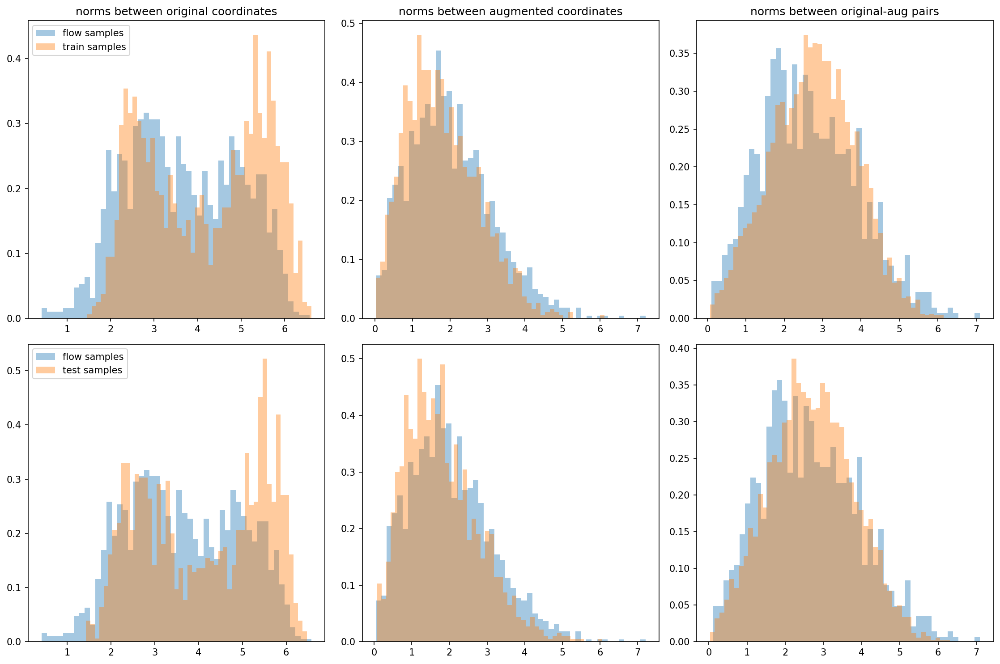

100%|█████████████████████████████████████████| 200/200 [01:57<00:00,  1.71it/s]


{'eval_log_lik': Array(-17.924032, dtype=float32), 'eval_marginal_log_lik': Array(-7.5292015, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00349293, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(0.00025369, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


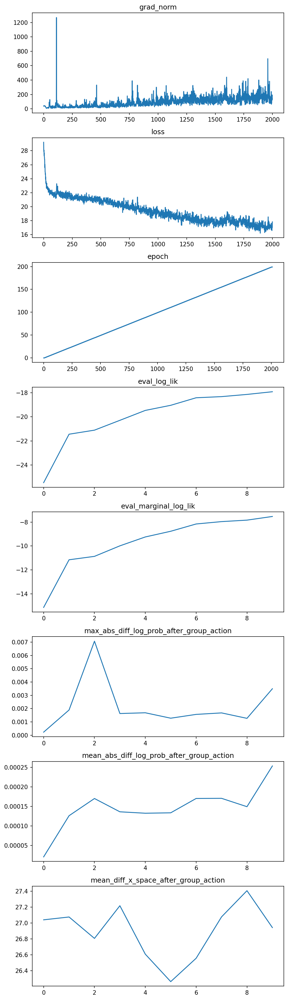

In [18]:
cfg.flow.type= "proj"
cfg.flow.act_norm = True
cfg.flow.kwargs.proj_v2.global_frame = False
cfg.flow.kwargs.proj_v2.process_flow_params_jointly = True

experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

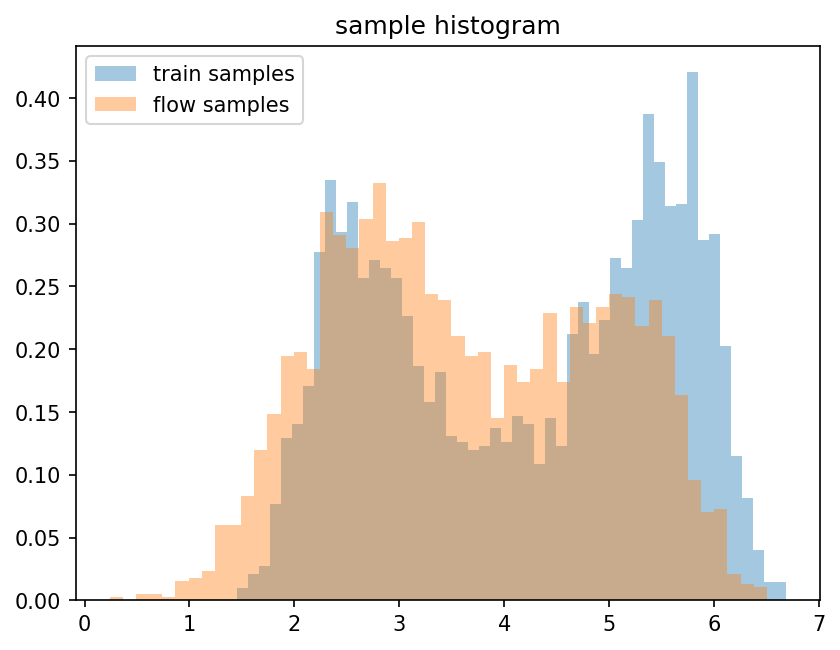

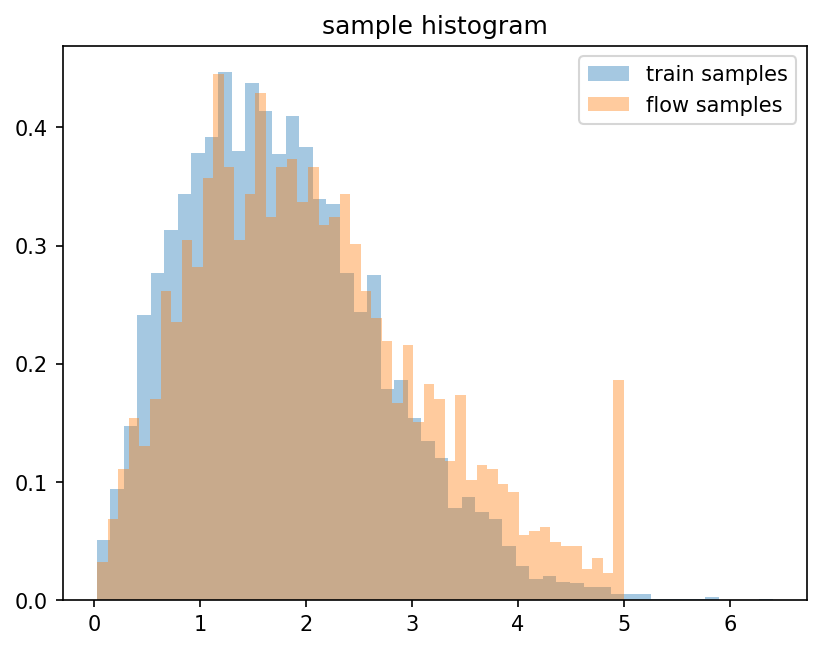

In [19]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# Improve expresivenss: more layers
- back to the original flow, but with more layers

training data shape of (1000, 4, 4)


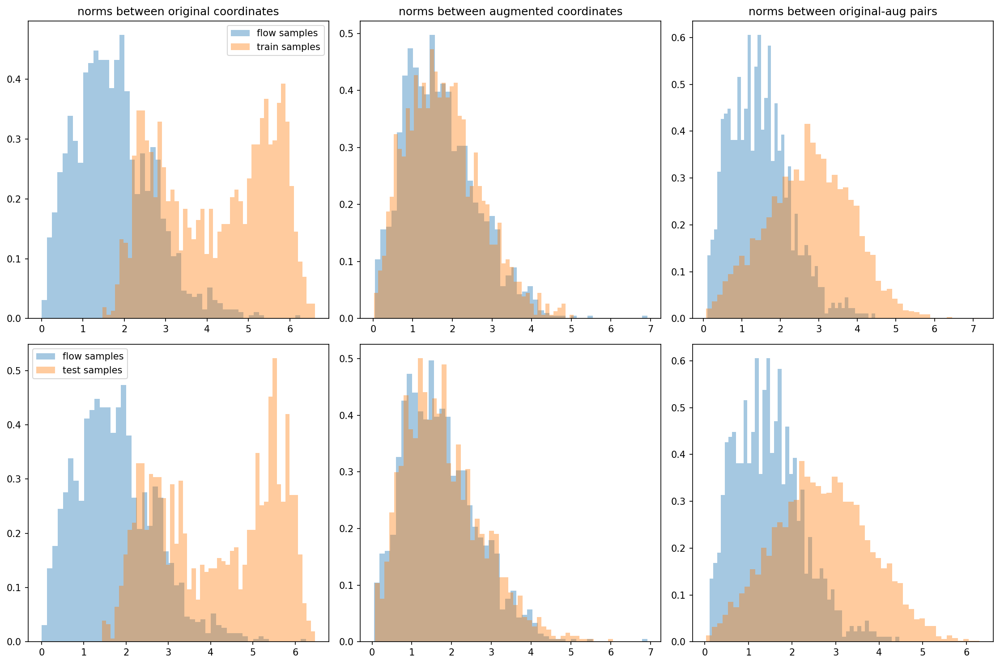

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


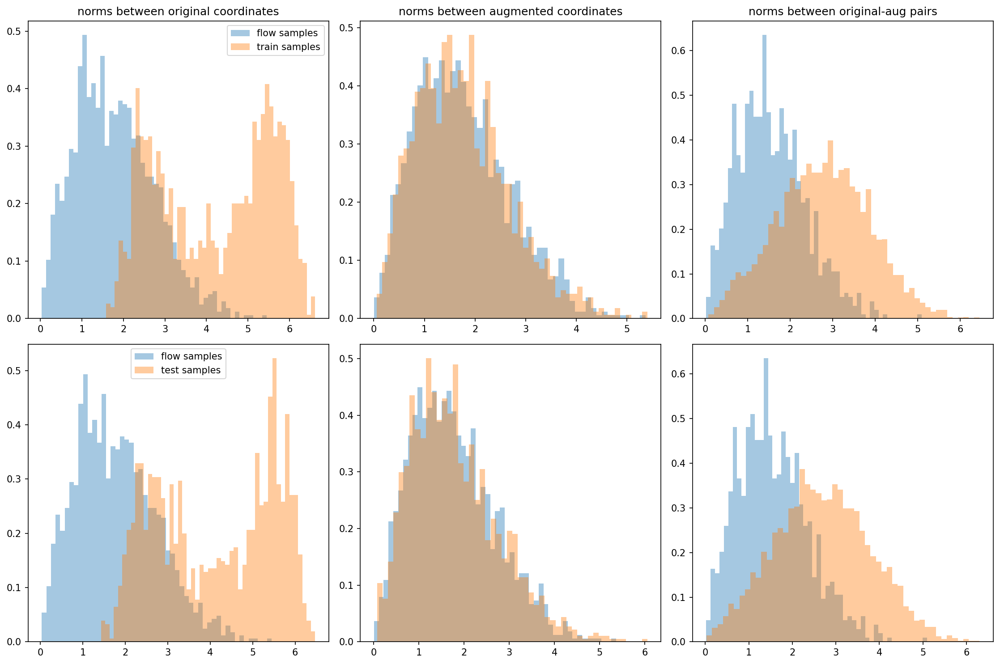

  0%|▏                                          | 1/200 [00:17<59:08, 17.83s/it]

{'eval_log_lik': Array(-27.747564, dtype=float32), 'eval_marginal_log_lik': Array(-17.415411, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.6130374e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.0112991e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|████▊                                     | 23/200 [00:24<00:55,  3.18it/s]

{'eval_log_lik': Array(-21.170767, dtype=float32), 'eval_marginal_log_lik': Array(-10.874803, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012608, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.233219e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:28<00:46,  3.47it/s]

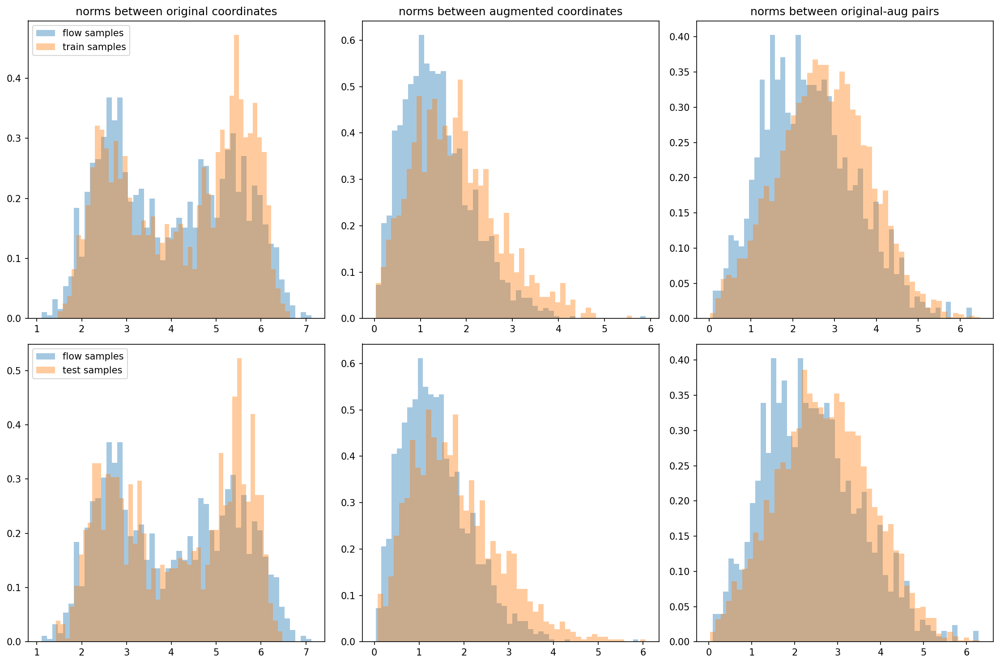

 22%|█████████▍                                | 45/200 [00:34<01:19,  1.96it/s]

{'eval_log_lik': Array(-20.97438, dtype=float32), 'eval_marginal_log_lik': Array(-10.729287, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.0001133, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.1307946e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [00:40<00:40,  3.25it/s]

{'eval_log_lik': Array(-20.815168, dtype=float32), 'eval_marginal_log_lik': Array(-10.505412, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012703, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.3219107e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:44<00:34,  3.56it/s]

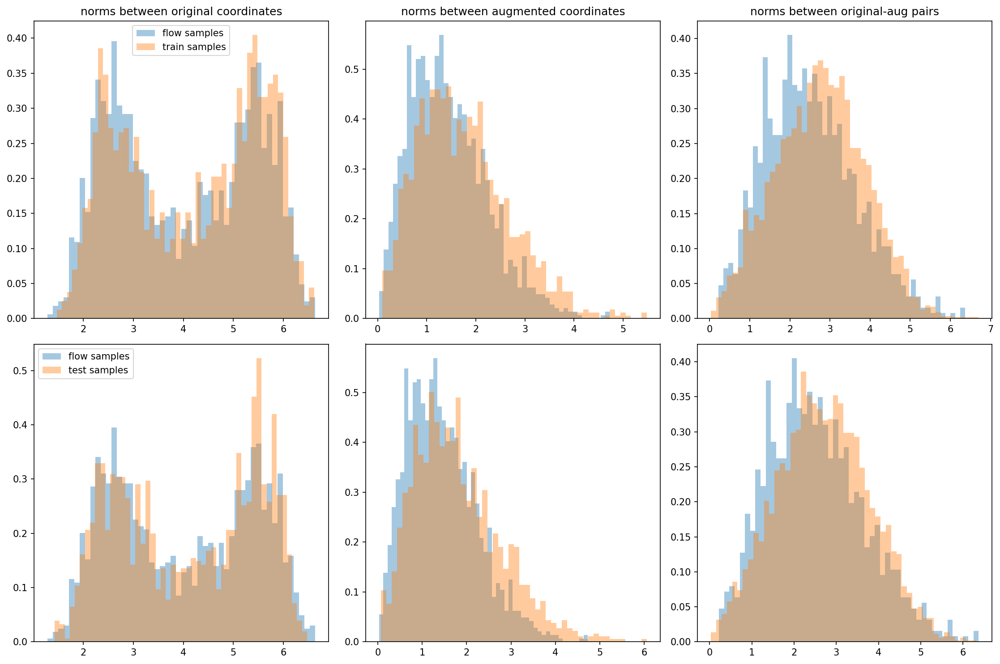

 44%|██████████████████▋                       | 89/200 [00:50<00:38,  2.87it/s]

{'eval_log_lik': Array(-20.819492, dtype=float32), 'eval_marginal_log_lik': Array(-10.588175, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012779, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.3243907e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▊                  | 111/200 [00:56<00:27,  3.23it/s]

{'eval_log_lik': Array(-20.753416, dtype=float32), 'eval_marginal_log_lik': Array(-10.469774, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00013638, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5850297e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [00:58<00:22,  3.54it/s]

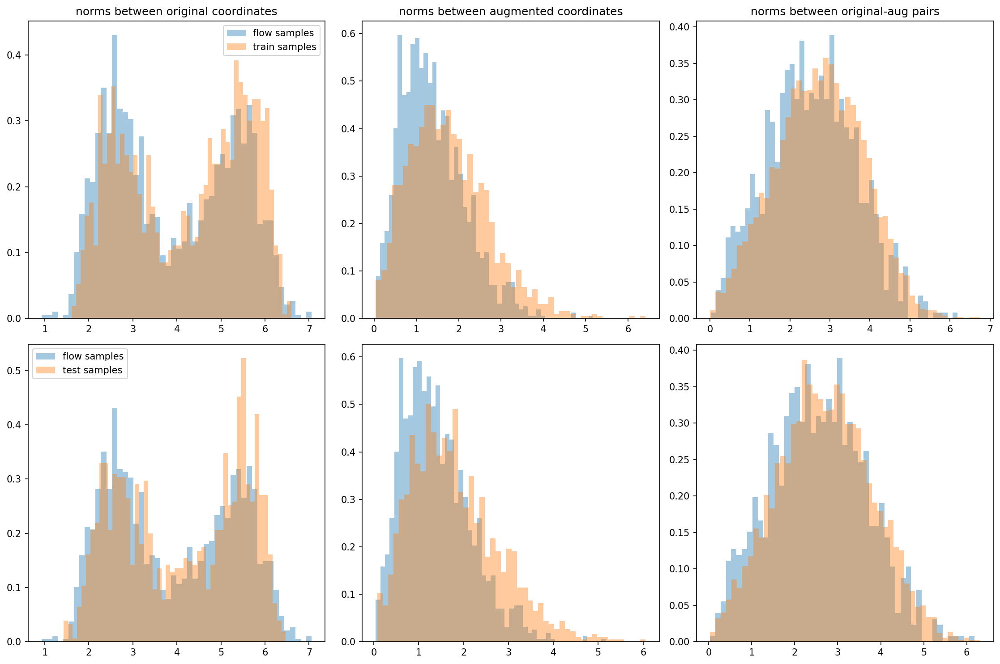

 66%|███████████████████████████▎             | 133/200 [01:06<00:21,  3.15it/s]

{'eval_log_lik': Array(-20.743835, dtype=float32), 'eval_marginal_log_lik': Array(-10.47684, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014858, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.4855612e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▊         | 155/200 [01:12<00:13,  3.25it/s]

{'eval_log_lik': Array(-20.771152, dtype=float32), 'eval_marginal_log_lik': Array(-10.400464, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00013828, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.4699211e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [01:13<00:11,  3.48it/s]

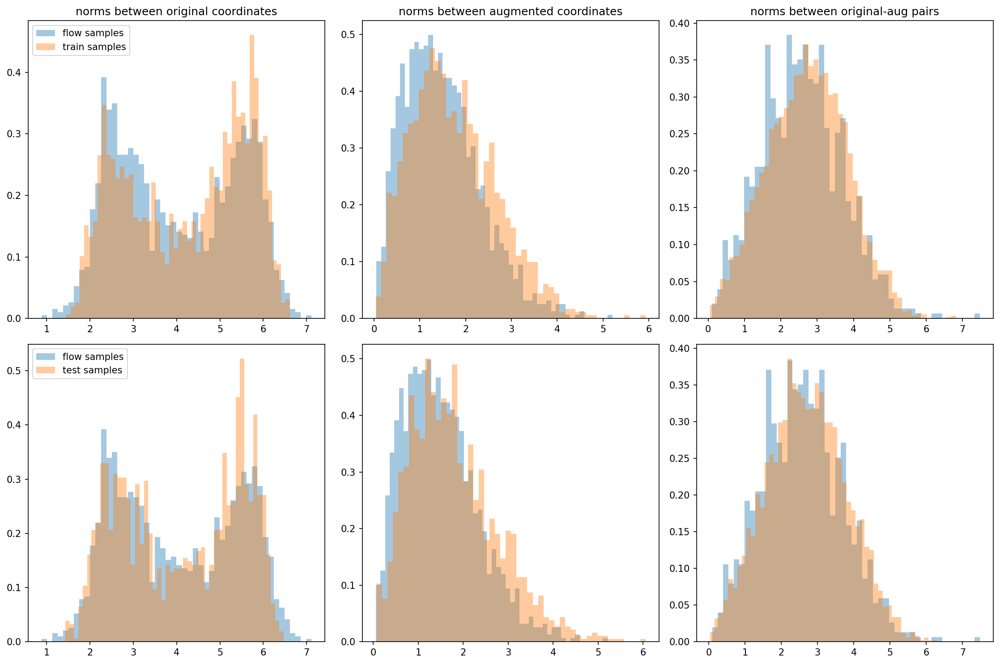

 88%|████████████████████████████████████▎    | 177/200 [01:22<00:07,  3.23it/s]

{'eval_log_lik': Array(-20.784857, dtype=float32), 'eval_marginal_log_lik': Array(-10.4727745, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012798, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.4350165e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [01:28<00:00,  3.56it/s]

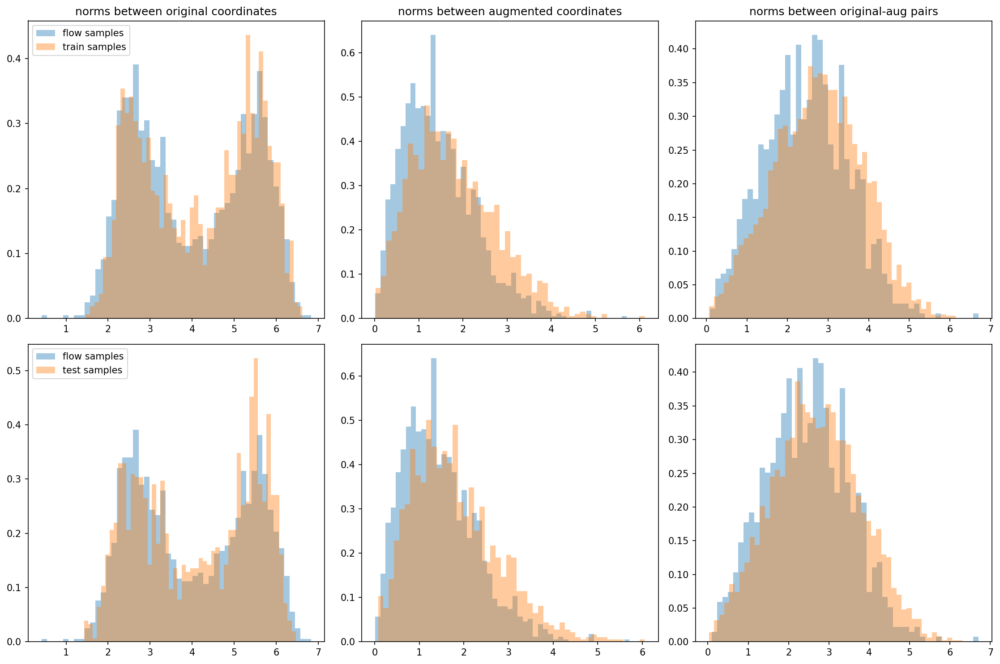

100%|█████████████████████████████████████████| 200/200 [01:31<00:00,  2.18it/s]


{'eval_log_lik': Array(-20.749945, dtype=float32), 'eval_marginal_log_lik': Array(-10.355113, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014677, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5842668e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


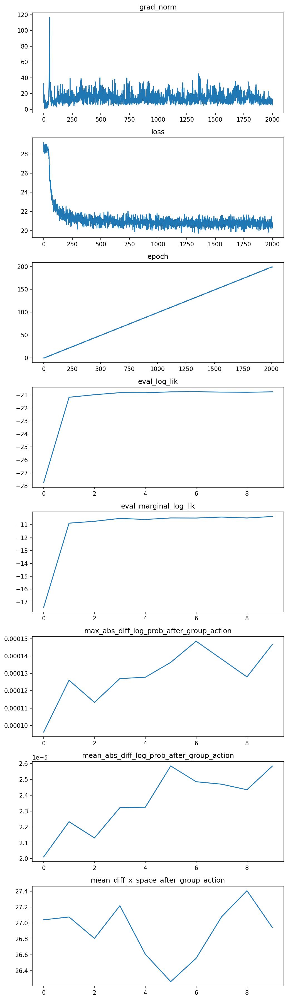

In [20]:
cfg.flow.type= "nice"
cfg.flow.act_norm = False
cfg.flow.n_layers = 8

experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

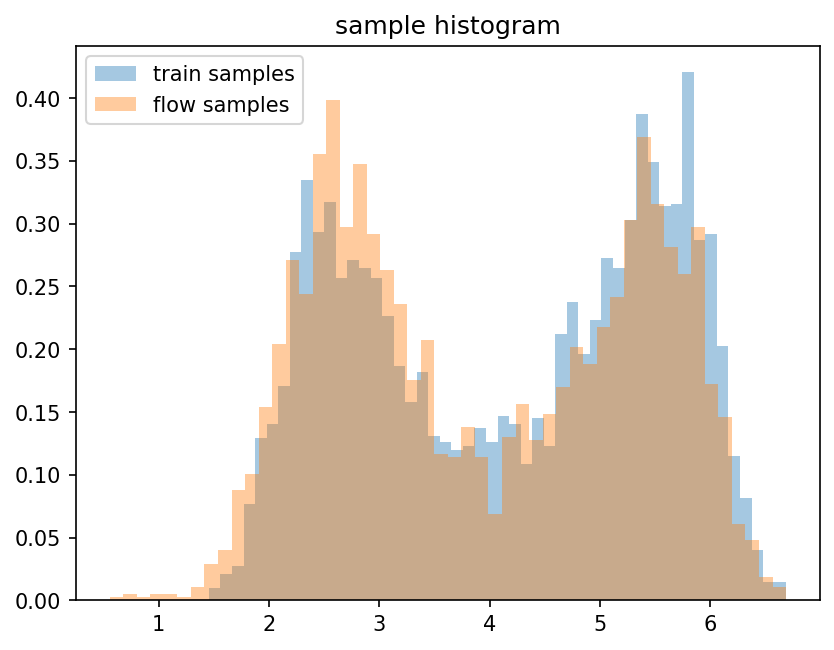

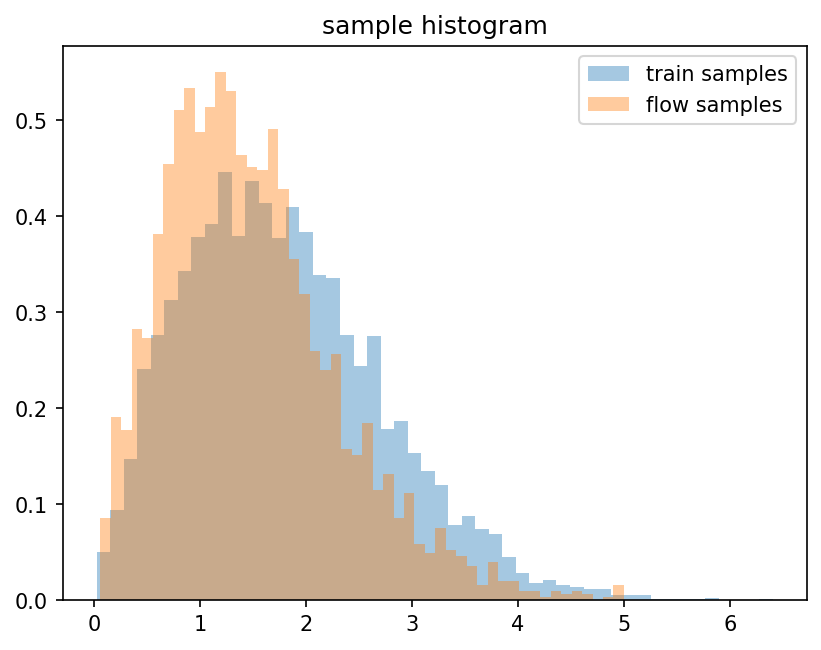

In [21]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# With Act Norm

In [22]:
cfg.flow.act_norm = True

training data shape of (1000, 4, 4)


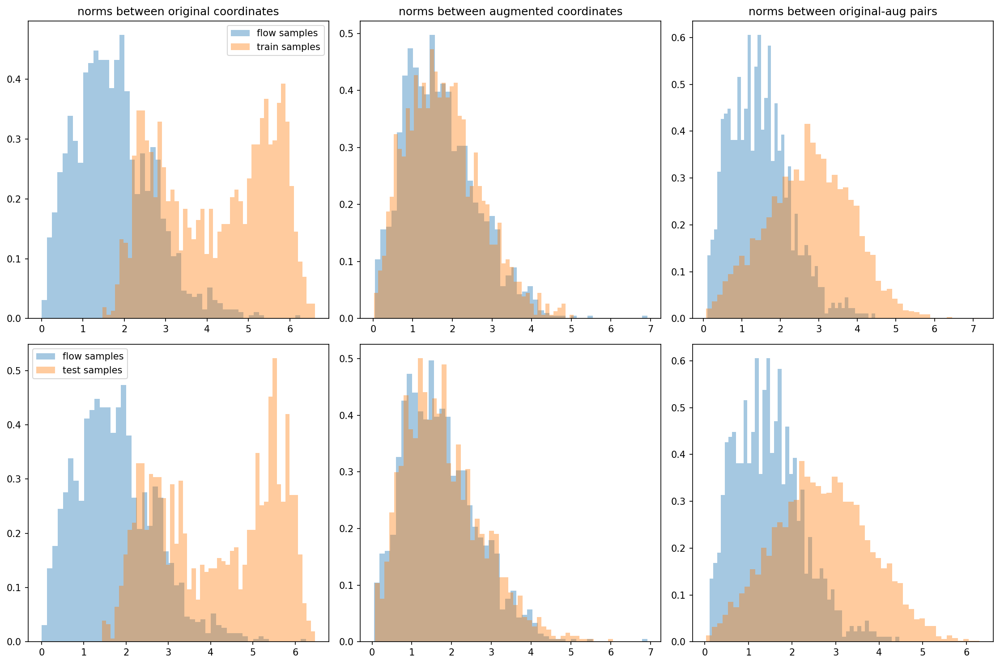

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


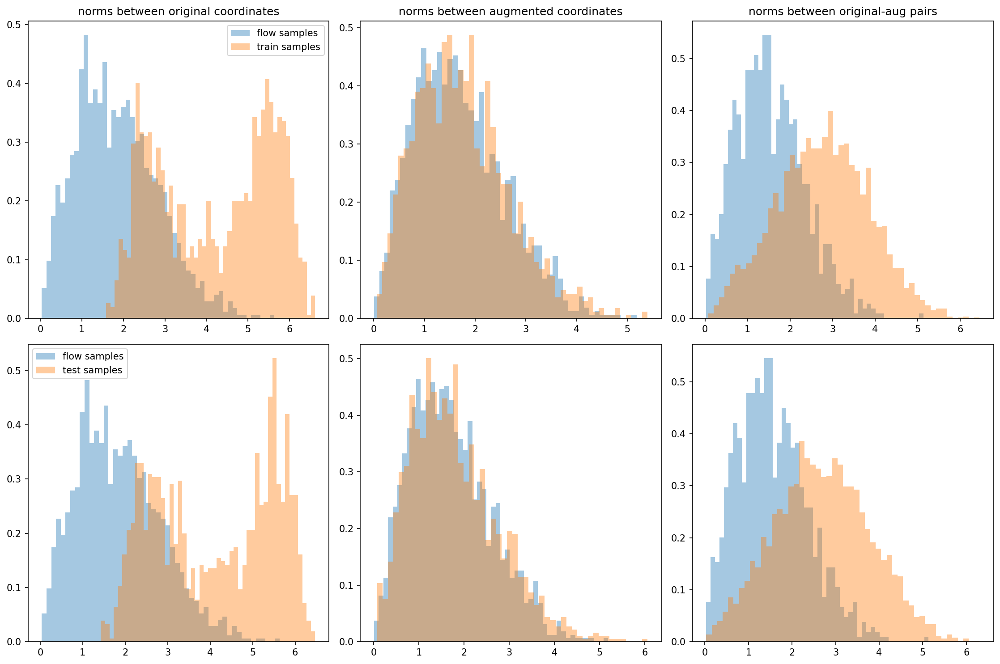

  0%|▏                                        | 1/200 [00:19<1:06:00, 19.90s/it]

{'eval_log_lik': Array(-27.05574, dtype=float32), 'eval_marginal_log_lik': Array(-16.723583, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.0001276, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.1947859e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|████▊                                     | 23/200 [00:26<00:55,  3.19it/s]

{'eval_log_lik': Array(-20.987726, dtype=float32), 'eval_marginal_log_lik': Array(-10.691763, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(9.231568e-05, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(1.88303e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [00:30<00:45,  3.50it/s]

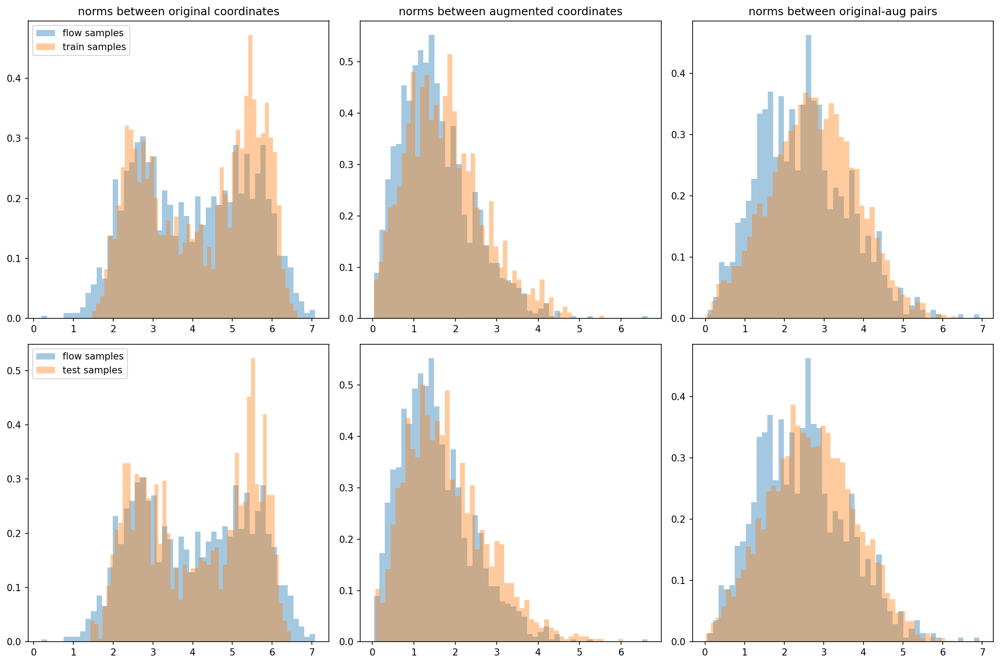

 22%|█████████▍                                | 45/200 [00:35<01:13,  2.11it/s]

{'eval_log_lik': Array(-20.827166, dtype=float32), 'eval_marginal_log_lik': Array(-10.582072, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00011101, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.0821572e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [00:42<00:41,  3.22it/s]

{'eval_log_lik': Array(-20.726736, dtype=float32), 'eval_marginal_log_lik': Array(-10.416978, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00013351, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.1471022e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [00:45<00:34,  3.51it/s]

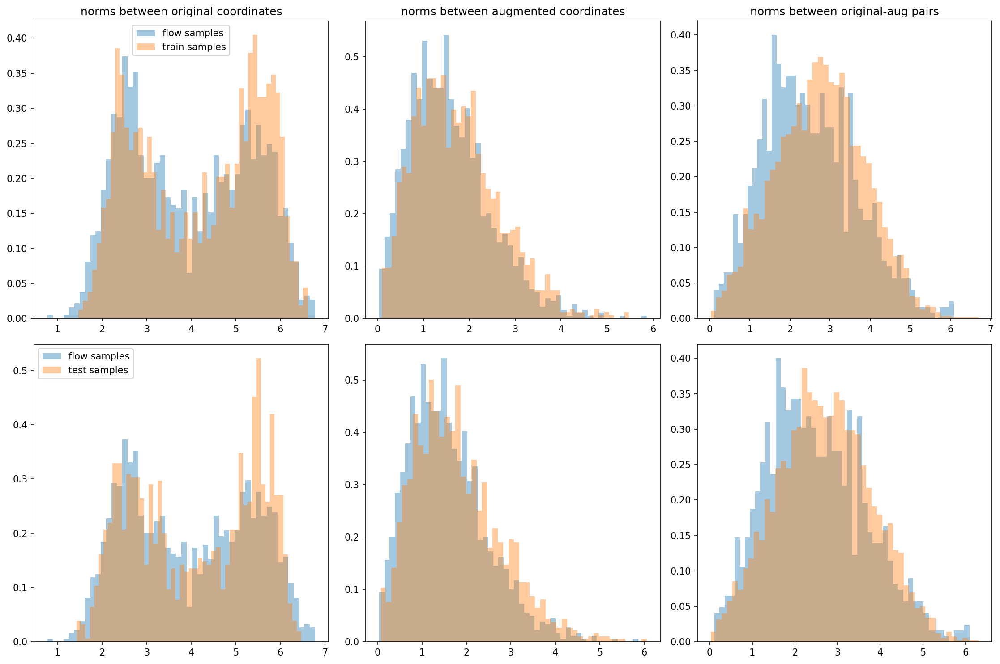

 44%|██████████████████▋                       | 89/200 [00:52<00:39,  2.82it/s]

{'eval_log_lik': Array(-20.678879, dtype=float32), 'eval_marginal_log_lik': Array(-10.447562, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012627, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.3223876e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▊                  | 111/200 [00:58<00:27,  3.22it/s]

{'eval_log_lik': Array(-20.533518, dtype=float32), 'eval_marginal_log_lik': Array(-10.249878, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014305, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.4240491e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [01:00<00:23,  3.51it/s]

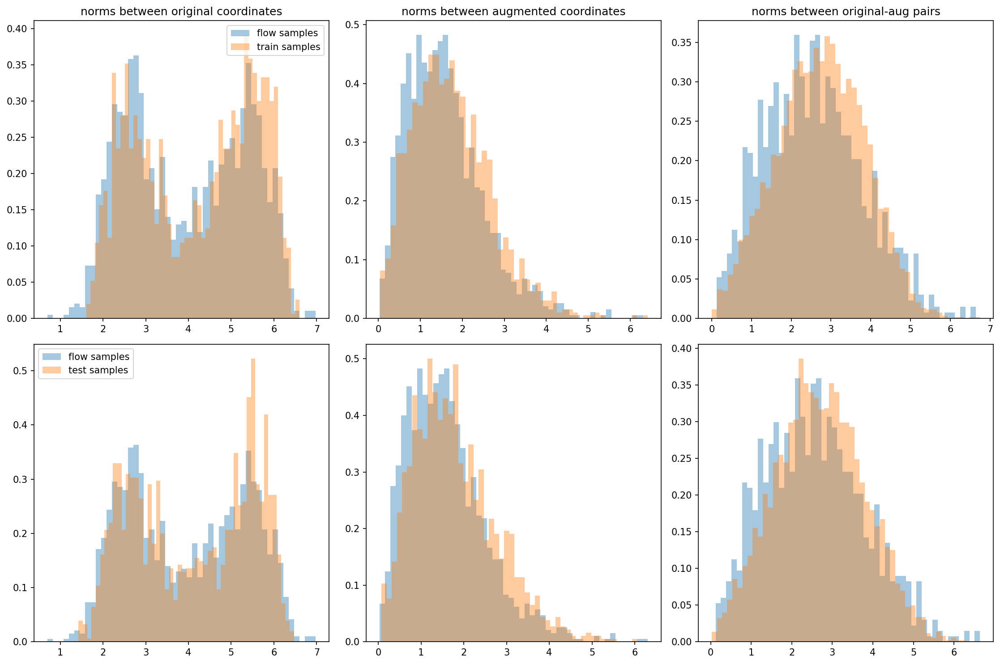

 66%|███████████████████████████▎             | 133/200 [01:08<00:21,  3.12it/s]

{'eval_log_lik': Array(-20.619358, dtype=float32), 'eval_marginal_log_lik': Array(-10.35236, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014248, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.426624e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▊         | 155/200 [01:14<00:13,  3.22it/s]

{'eval_log_lik': Array(-20.571358, dtype=float32), 'eval_marginal_log_lik': Array(-10.200667, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00013294, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5023459e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [01:15<00:11,  3.44it/s]

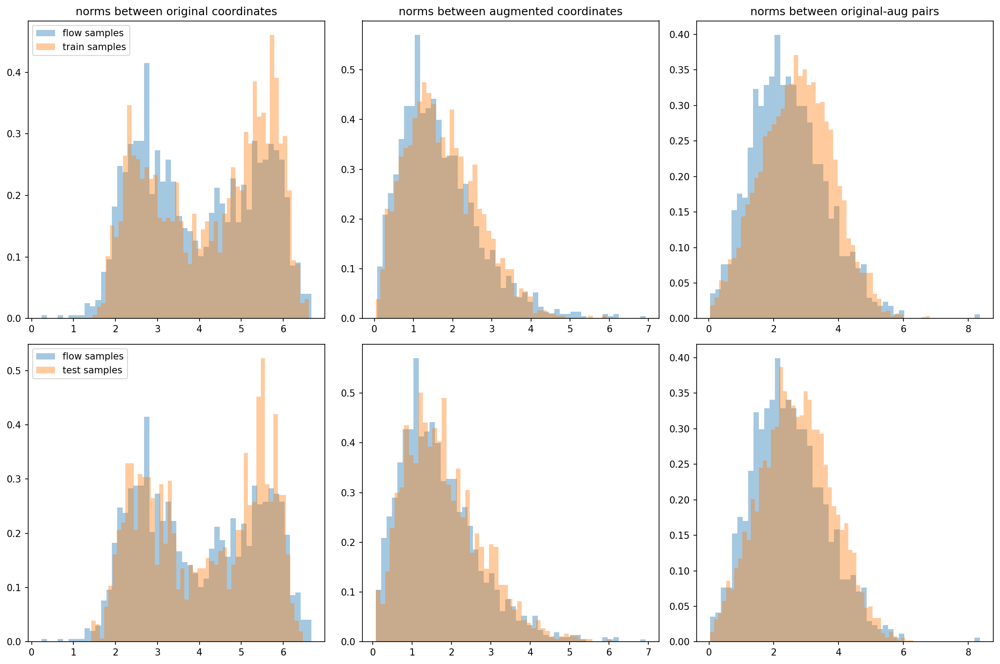

 88%|████████████████████████████████████▎    | 177/200 [01:24<00:07,  3.19it/s]

{'eval_log_lik': Array(-20.506569, dtype=float32), 'eval_marginal_log_lik': Array(-10.194489, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.0001627, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5093079e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [01:31<00:00,  3.52it/s]

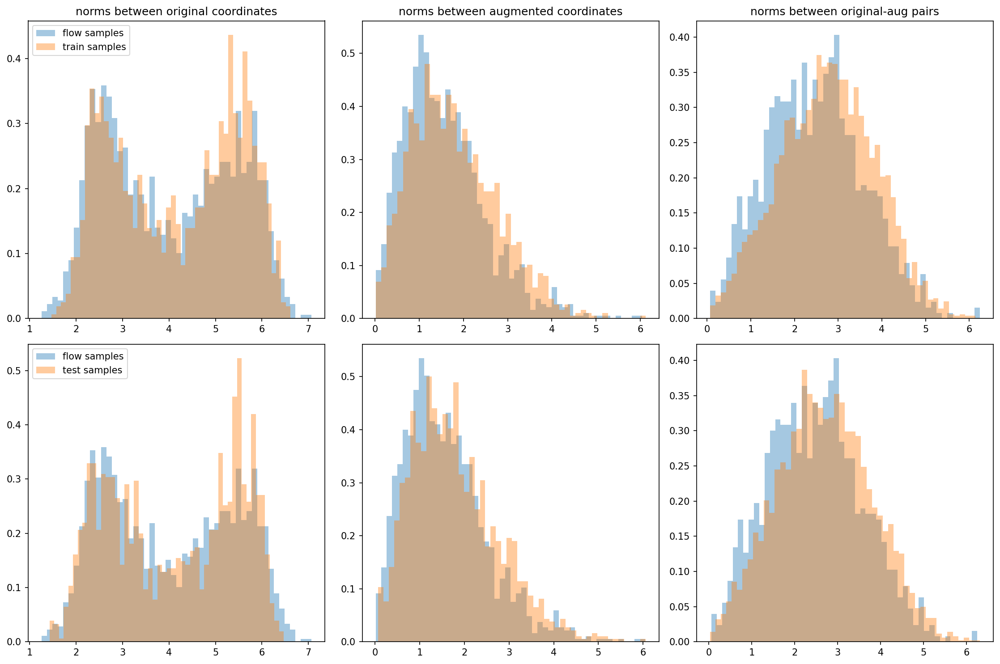

100%|█████████████████████████████████████████| 200/200 [01:34<00:00,  2.11it/s]


{'eval_log_lik': Array(-20.549417, dtype=float32), 'eval_marginal_log_lik': Array(-10.154586, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00018597, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.704525e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


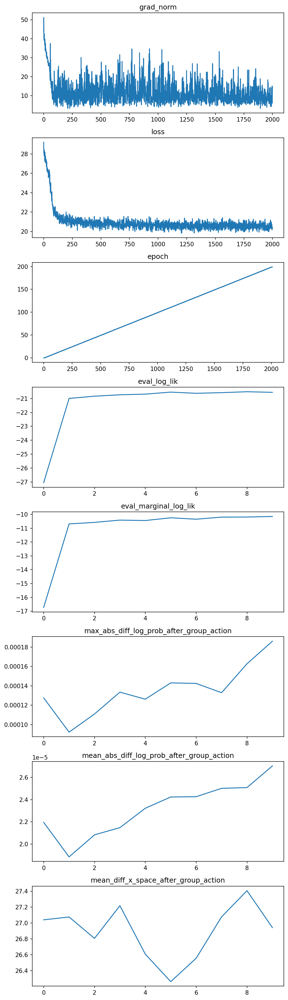

In [23]:
experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

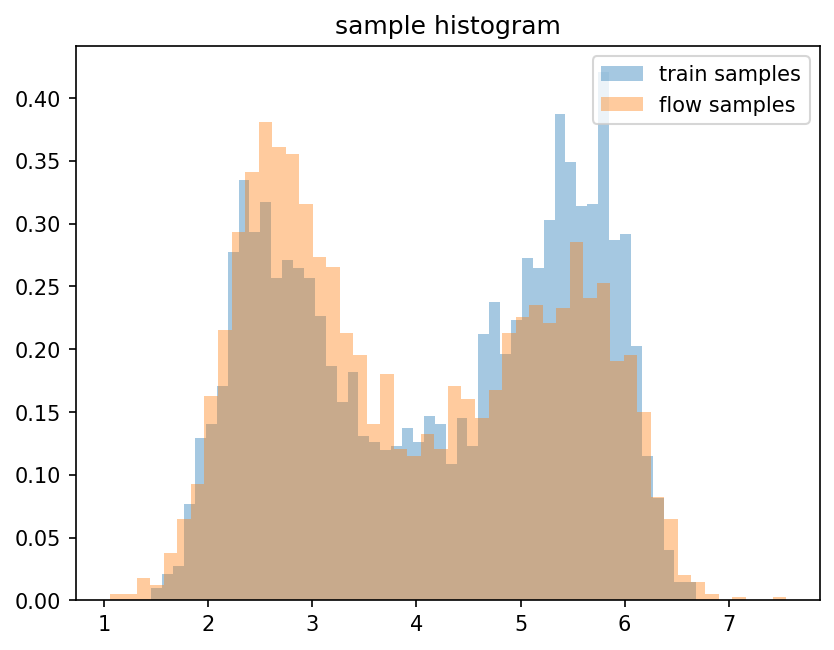

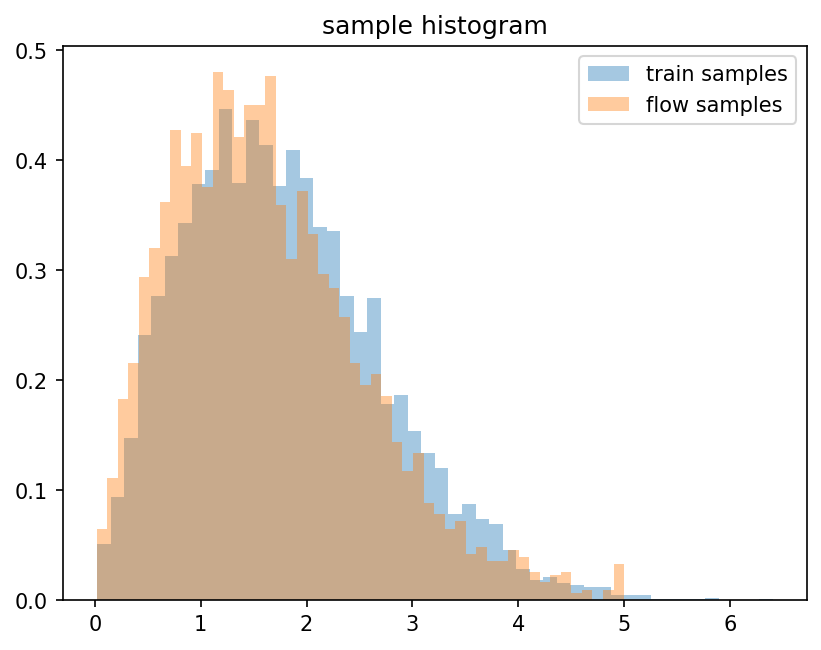

In [24]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# With more expressive vector_scale_shift flow

training data shape of (1000, 4, 4)


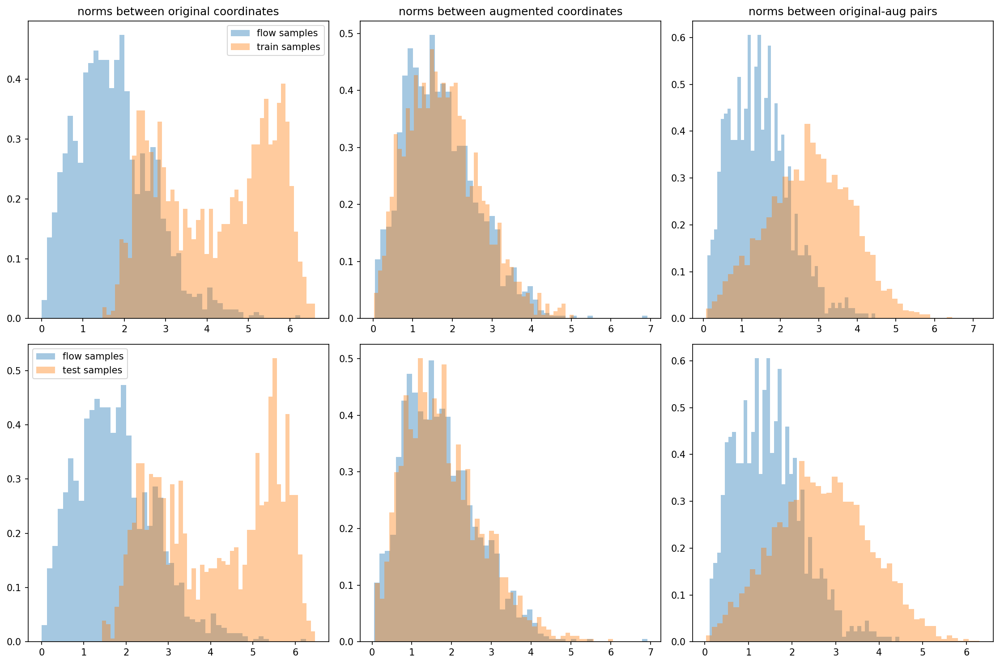

  0%|                                                   | 0/200 [00:00<?, ?it/s]

non numeric history values being saved


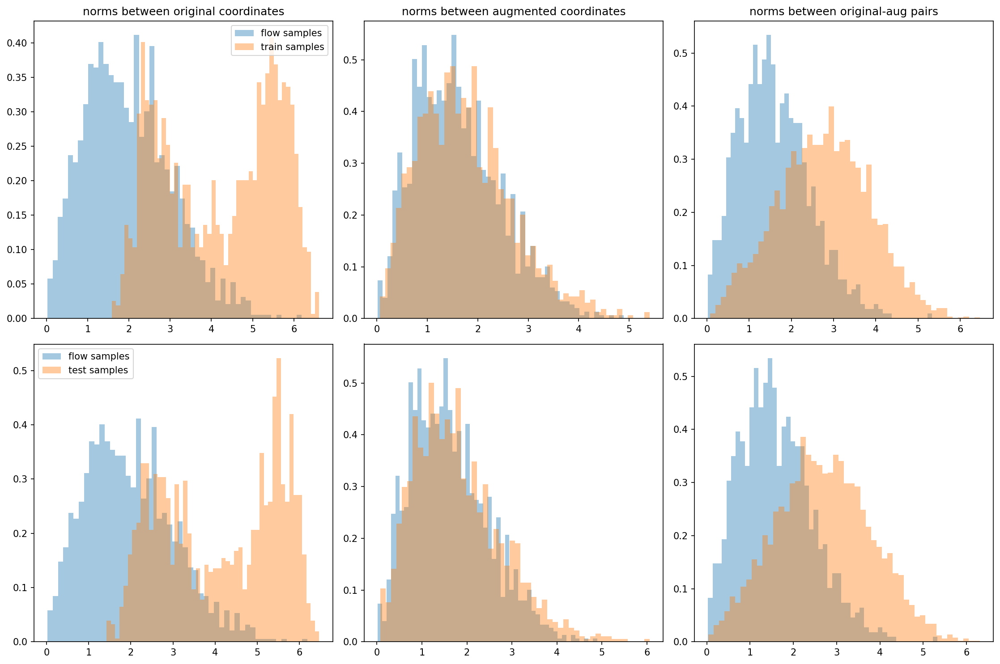

  0%|▏                                        | 1/200 [00:39<2:09:48, 39.14s/it]

{'eval_log_lik': Array(-25.94303, dtype=float32), 'eval_marginal_log_lik': Array(-15.610873, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.0001503, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5177002e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.040243, dtype=float32)}


 12%|████▊                                     | 23/200 [00:52<01:57,  1.50it/s]

{'eval_log_lik': Array(-21.090393, dtype=float32), 'eval_marginal_log_lik': Array(-10.79443, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00012665, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.2730826e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.076023, dtype=float32)}


 20%|████████▏                                 | 39/200 [01:02<01:37,  1.65it/s]

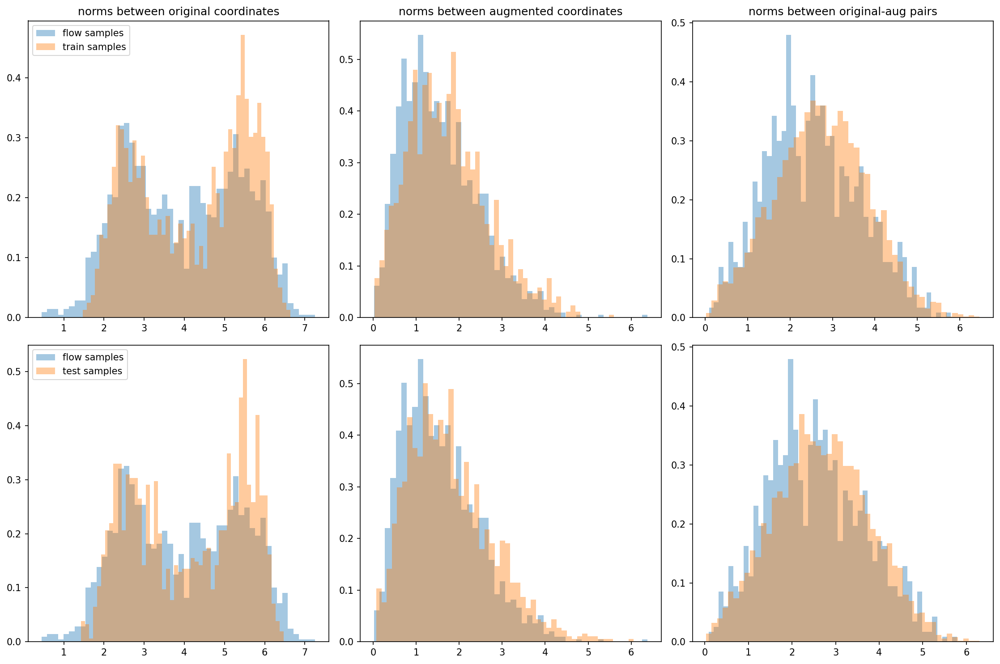

 22%|█████████▍                                | 45/200 [01:09<02:08,  1.20it/s]

{'eval_log_lik': Array(-20.842619, dtype=float32), 'eval_marginal_log_lik': Array(-10.597525, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00016804, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.5903702e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.80615, dtype=float32)}


 34%|██████████████                            | 67/200 [01:22<01:27,  1.52it/s]

{'eval_log_lik': Array(-20.763973, dtype=float32), 'eval_marginal_log_lik': Array(-10.454216, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014143, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.7610778e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.218082, dtype=float32)}


 40%|████████████████▌                         | 79/200 [01:30<01:13,  1.65it/s]

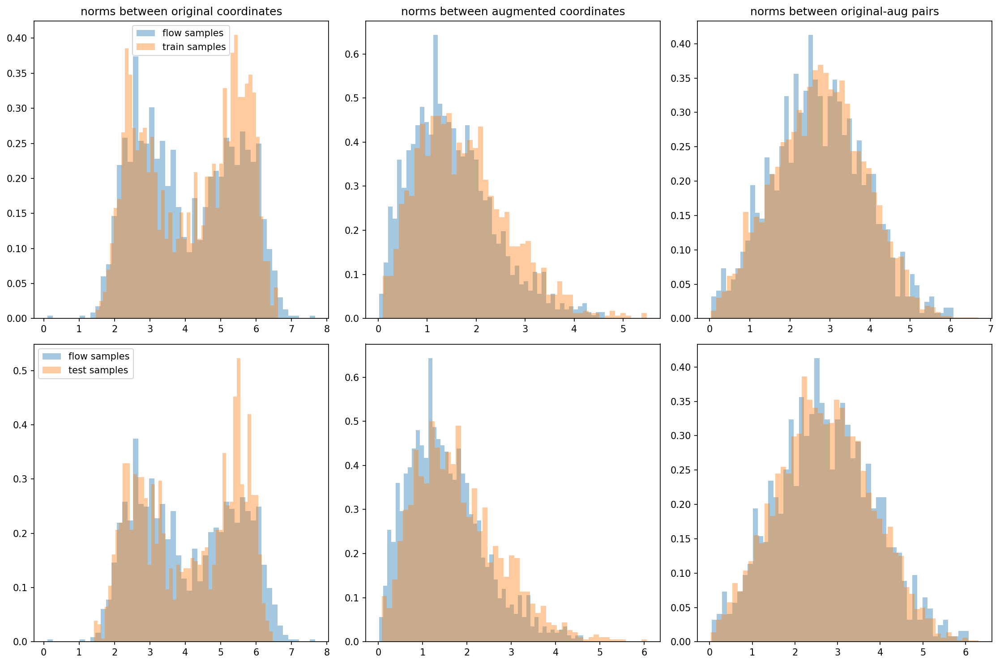

 44%|██████████████████▋                       | 89/200 [01:39<01:17,  1.43it/s]

{'eval_log_lik': Array(-20.736303, dtype=float32), 'eval_marginal_log_lik': Array(-10.504985, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00014019, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(2.9455186e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.607157, dtype=float32)}


 56%|██████████████████████▊                  | 111/200 [01:53<00:58,  1.52it/s]

{'eval_log_lik': Array(-20.540762, dtype=float32), 'eval_marginal_log_lik': Array(-10.257121, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00016737, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(3.2173157e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.261038, dtype=float32)}


 60%|████████████████████████▍                | 119/200 [01:58<00:49,  1.65it/s]

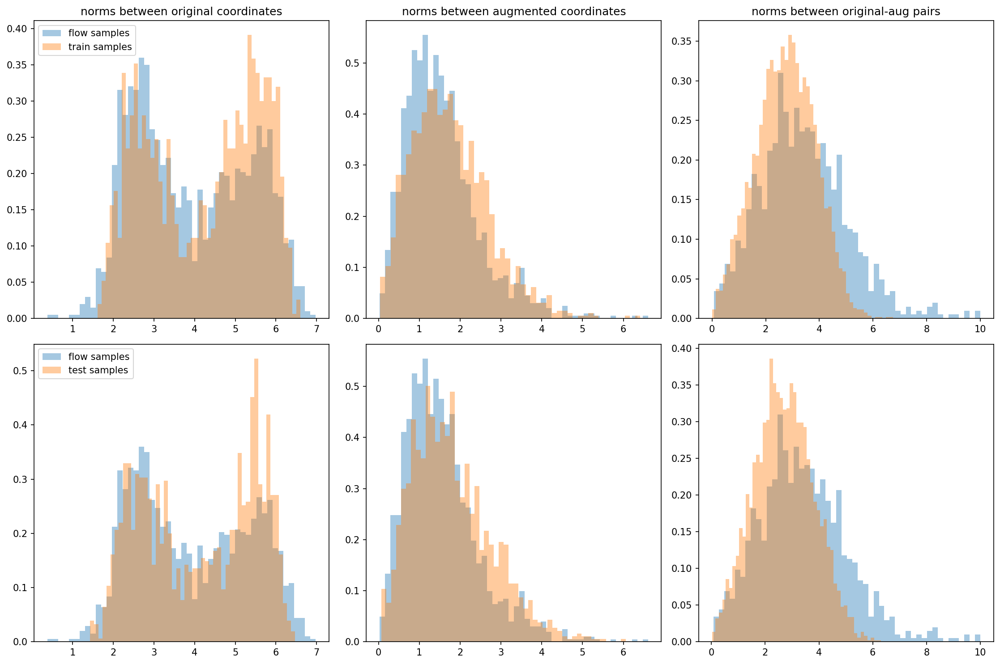

 66%|███████████████████████████▎             | 133/200 [02:10<00:45,  1.48it/s]

{'eval_log_lik': Array(-19.41484, dtype=float32), 'eval_marginal_log_lik': Array(-9.147843, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00034838, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(4.6737667e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.555658, dtype=float32)}


 78%|███████████████████████████████▊         | 155/200 [02:24<00:29,  1.51it/s]

{'eval_log_lik': Array(-18.958303, dtype=float32), 'eval_marginal_log_lik': Array(-8.587615, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00040951, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(5.3713797e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.077555, dtype=float32)}


 80%|████████████████████████████████▌        | 159/200 [02:26<00:25,  1.61it/s]

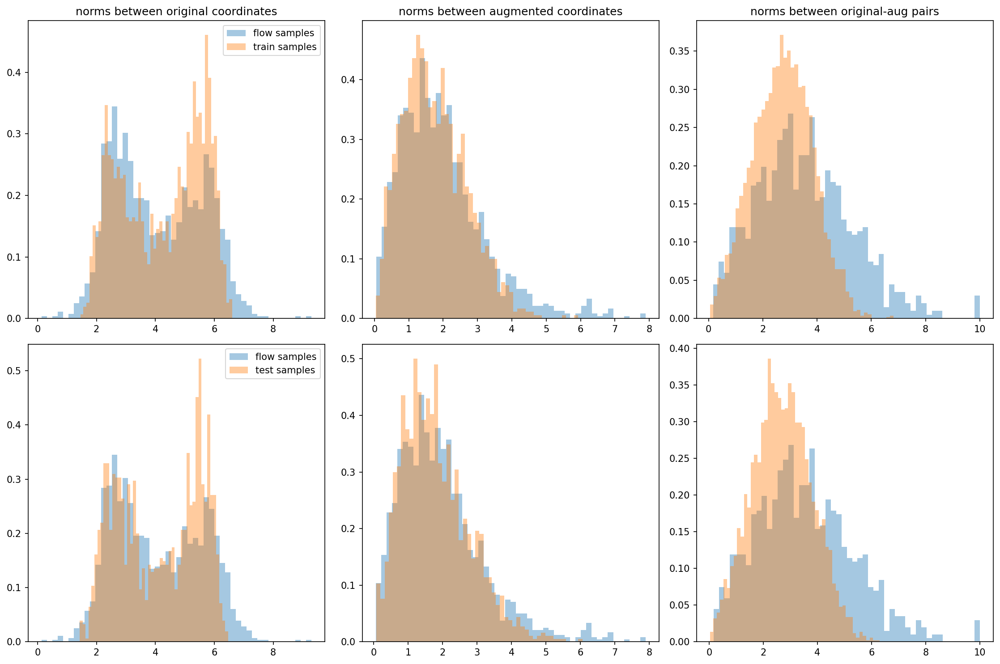

 88%|████████████████████████████████████▎    | 177/200 [02:41<00:15,  1.50it/s]

{'eval_log_lik': Array(-19.847988, dtype=float32), 'eval_marginal_log_lik': Array(-9.535905, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00021763, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(3.7546153e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(27.407667, dtype=float32)}


100%|████████████████████████████████████████▊| 199/200 [02:55<00:00,  1.65it/s]

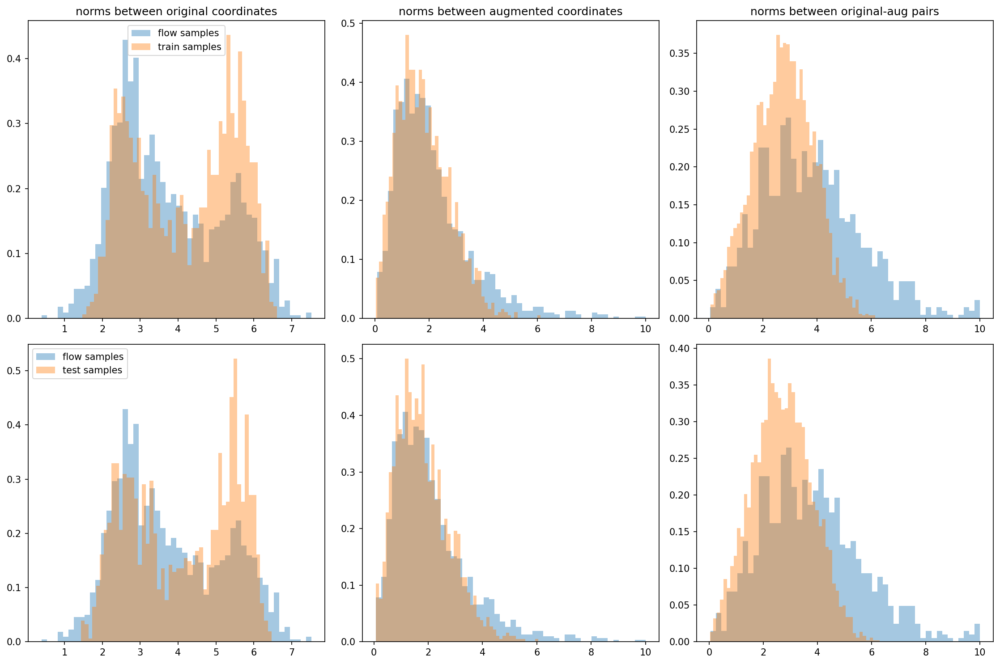

100%|█████████████████████████████████████████| 200/200 [02:59<00:00,  1.12it/s]


{'eval_log_lik': Array(-18.602137, dtype=float32), 'eval_marginal_log_lik': Array(-8.207303, dtype=float32), 'max_abs_diff_log_prob_after_group_action': Array(0.00035267, dtype=float32), 'mean_abs_diff_log_prob_after_group_action': Array(5.0273895e-05, dtype=float32), 'mean_diff_x_space_after_group_action': Array(26.942327, dtype=float32)}


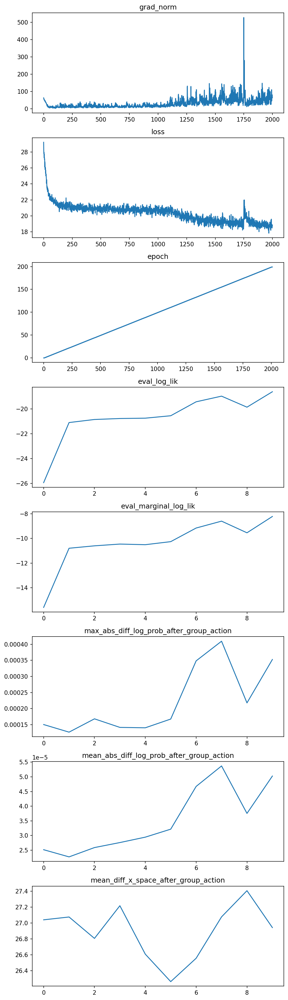

In [25]:
cfg.flow.type= "vector_scale_shift"
cfg.flow.act_norm = True

experiment_config = create_train_config(cfg, dim=2, n_nodes=4,
                                        load_dataset=load_dataset)
logger, params, log_prob_fn, sample_and_log_prob_fn = train(experiment_config)

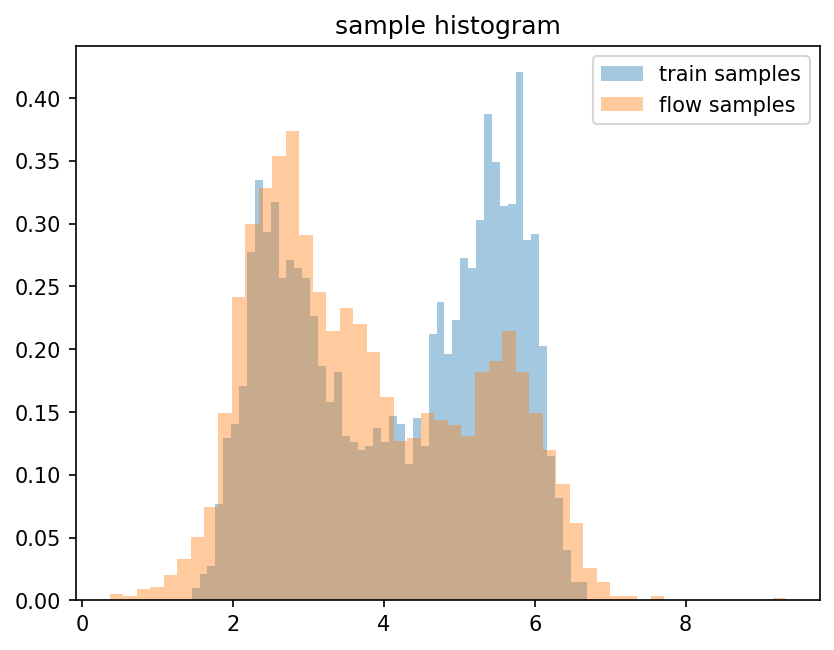

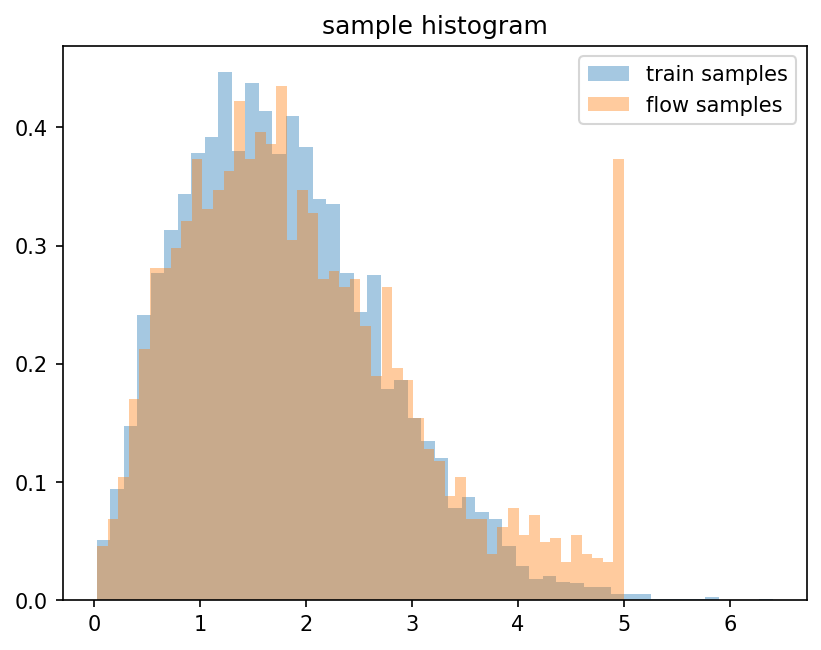

In [26]:
x = sample_and_log_prob_fn.apply(params, jax.random.PRNGKey(1), (512,))[0]

fig, axs = plt.subplots()
# plot_sample_hist(test_data, axs, original_coords=True, label='test samples')
plot_sample_hist(train_data, axs, original_coords=True, label='train samples')
plot_sample_hist(x, axs, original_coords=True, label='flow samples')
axs.set_title("sample histogram")
axs.legend()
plt.show()

fig, axs = plt.subplots()
plot_sample_hist(train_data, axs, original_coords=False, label='train samples')
plot_sample_hist(x, axs, original_coords=False, label='flow samples', max_distance=5)
axs.set_title("sample histogram")
axs.legend()
plt.show()

# 